This pipeline opens the result of ICAalamelodic.m, lets the user interactively label the components that look like neuronal activity (rather than movement artefacts or noise), sort them by label, plots a final summary for the chosen components, and save the reordered maps and time series.

In [99]:
clear all

In [100]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy import io
%matplotlib inline 
import pylab

Open time series

In [101]:
import scipy.io as sio

In [102]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename)

/home/sophie/Downloads/862ss2c500regcUKF150Smith0_4TS.mat


In [103]:
Ua=sio.loadmat(filename)

In [104]:
DT=Ua['TSo']

In [105]:
DT.shape

(2671, 150)

In [106]:
S1=DT.shape

In [107]:
DTmean=np.zeros(S1)
DTvar=np.zeros(S1)
Var=np.zeros(S1[1])

In [108]:
for i in range(S1[1]):
    DTmean[:,i]=DT[:,i]-np.mean(DT[:,i],0)

In [109]:
for i in range(S1[1]):
    Var[i]=np.sqrt(np.var(DTmean[:,i]))
    DTvar[:,i]=DTmean[:,i]/Var[i]

In [110]:
DTvar.shape

(2671, 150)

open maps

In [111]:
from nifti import NiftiImage

In [112]:
import nibabel as nb

In [113]:
# from http://stackoverflow.com/questions/3579568/choosing-a-file-in-python-with-simple-dialog
from Tkinter import Tk
from tkFileDialog import askopenfilename

Tk().withdraw() # we don't want a full GUI, so keep the root window from appearing
filename2 = askopenfilename() # show an "Open" dialog box and return the path to the selected file
print(filename2)

/home/sophie/Downloads/862ss2c500regcUKF150Smith0_4IC.nii


In [114]:
img1 = nb.load(filename2)

In [115]:
data = img1.get_data()

In [116]:
S=data.shape

In [117]:
S

(175, 84, 34, 150)

# Zscore maps

In [118]:
Demean=np.zeros(S)
Dmaps=np.zeros(S)
Dvar=np.zeros(S)
Var=np.zeros(S[3])
D2=np.zeros([S[0],S[1],5,S[3]])
Tvar=np.zeros(S[3])

Transform the maps to have zero mean

In [119]:
for i in range(S[3]):
    Demean[:,:,:,i]=data[:,:,:,i]-np.mean(np.mean(np.mean(data[:,:,:,i],0),0),0)

Transform the maps to have unit variance and zscore

In [131]:
for i in range(S[3]):
    Dsq=np.reshape(Demean[:,:,:,i],S[0]*S[1]*S[2])
    Var[i]=np.sqrt(np.var(Dsq))
    Dvar=Demean[:,:,:,i]/Var[i]
    Dmaps[:,:,:,i]=Dvar-2.5
Dmaps[Dmaps<0]=0

Order ICs by variance

In [132]:
datao=data
Dmapso=Dmaps

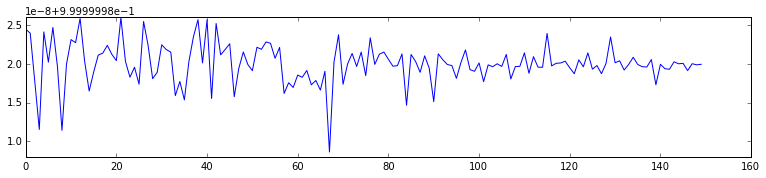

In [133]:
plt.plot(Var)

#Separate maps in substacks, sort the independent components by brain regions 

In [134]:
my_cmap=plt.cm.jet
my_cmap.set_bad(alpha=0)
Good_ICs=np.zeros(S[3])
Label_ICs=[]
pylab.rcParams['figure.figsize'] = (13, 2.5)

In [135]:
Dtemp=data[:,:,:,0]

In [136]:
%%javascript
IPython.OutputArea.auto_scroll_threshold =4000;

In [137]:
if S[2]>5:
    Nstack=5
    Int100=[(i+1)*100/Nstack for i in range(Nstack)]
    Percs=np.percentile(range(S[2]),Int100)
    Indices=np.split(range(S[2]),Percs)
    D1=np.zeros([S[0],S[1],Nstack])
    Dmean=Dtemp[:,:,range(Nstack)]
    for i in range(Nstack):
        Vmean=np.mean(Dtemp[:,:,Indices[i]],2)
        #Dmean[:,:,i]=np.max(Vmean,0)
        Dmean[:,:,i]=Vmean
else:
    Nstack=S[2]
    D1=np.zeros([S[0],S[1],S[2]])
    Dmean=data[:,:,range(S[2])]  
    Dmean=np.squeeze(Dtemp[:,:,:])

In [138]:
DTvar.shape

(2671, 150)

In [139]:
S

(175, 84, 34, 150)

0


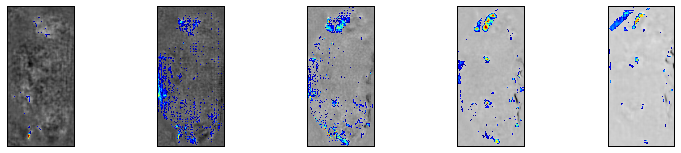

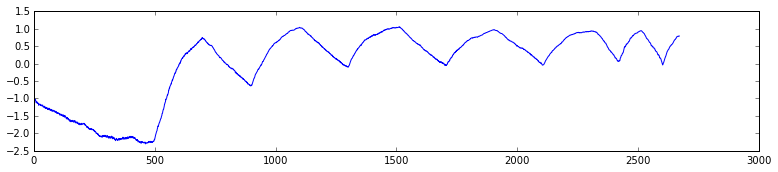


1


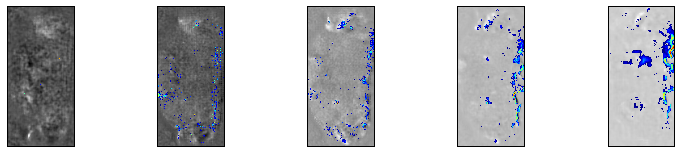

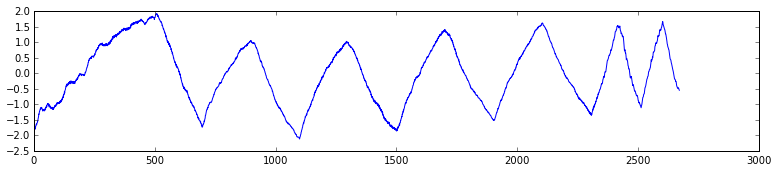


2


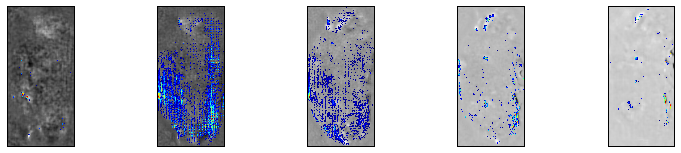

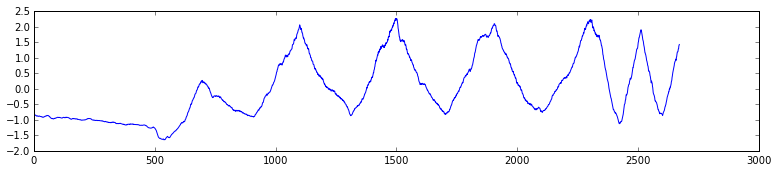


3


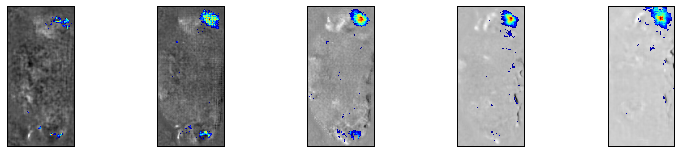

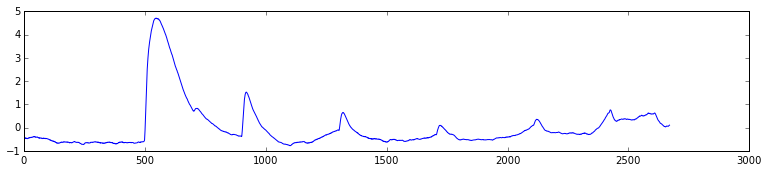

a
4


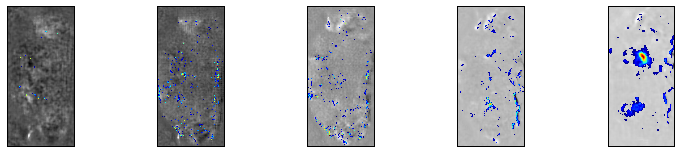

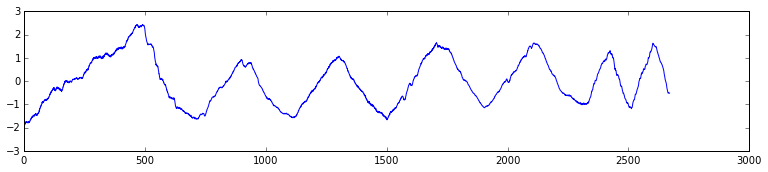


5


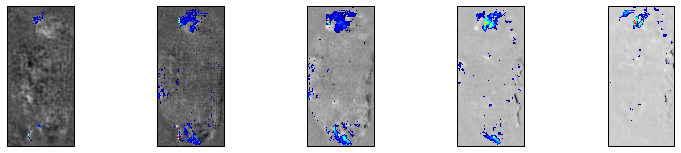

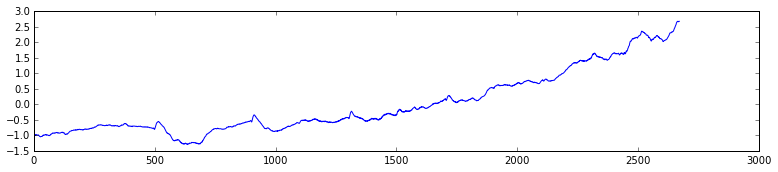


6


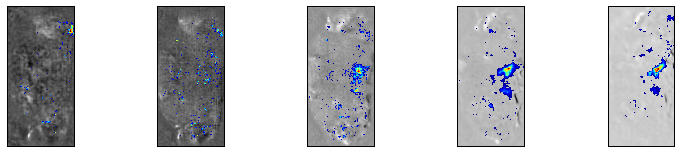

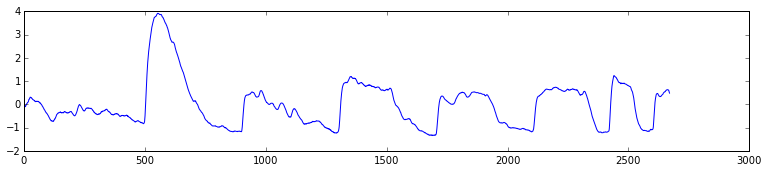

a
7


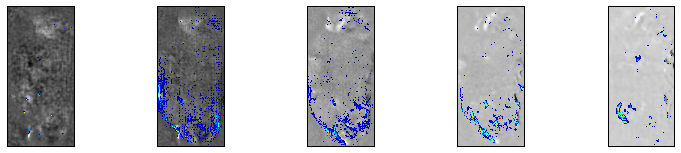

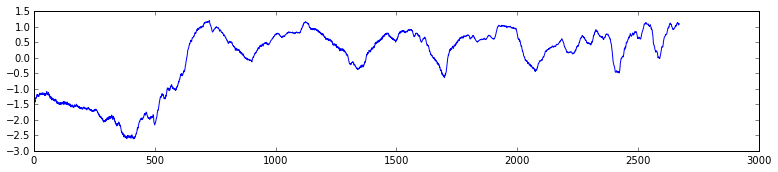


8


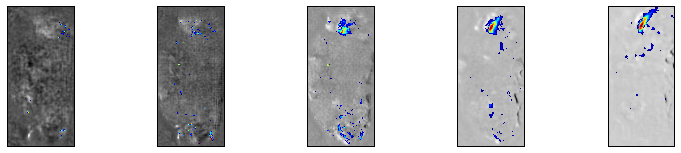

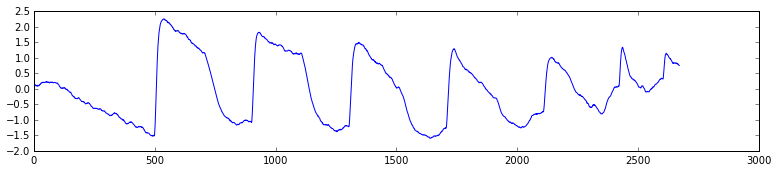

a
9


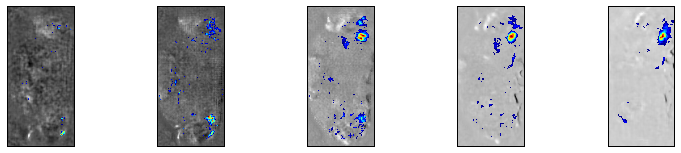

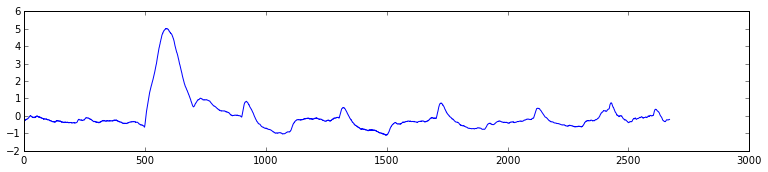

a
10


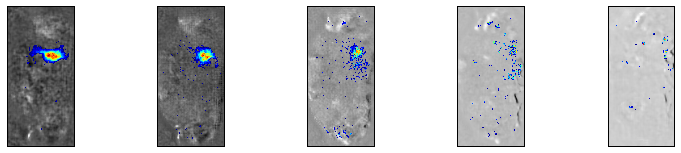

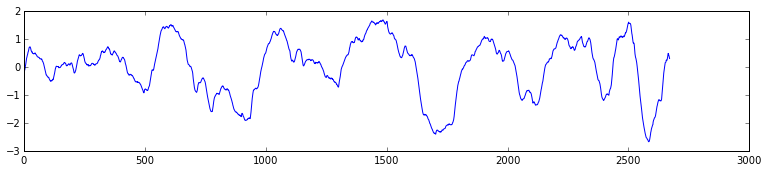

a
11


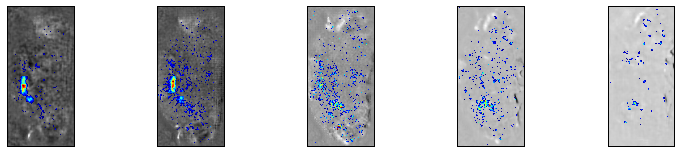

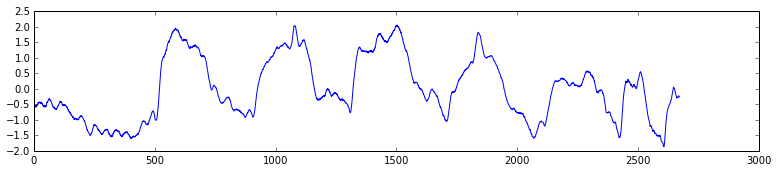

a
12


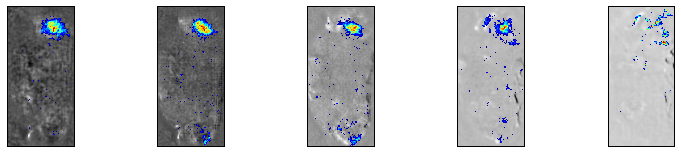

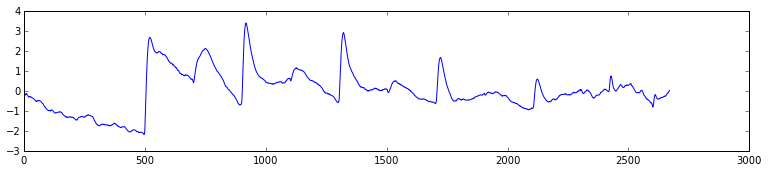

a
13


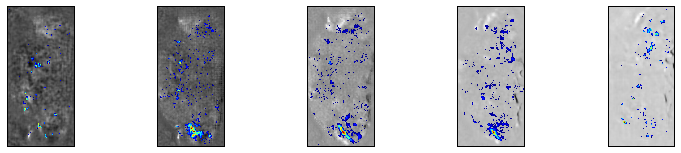

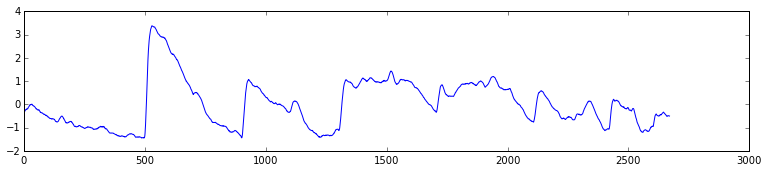

a
14


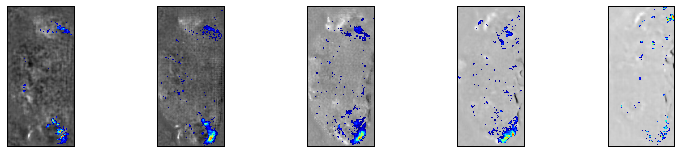

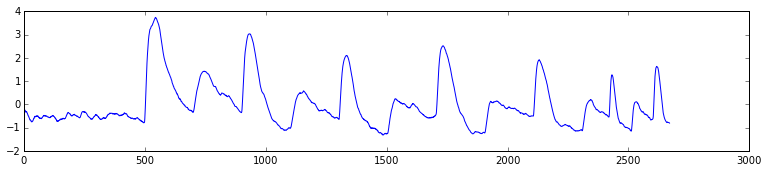

a
15


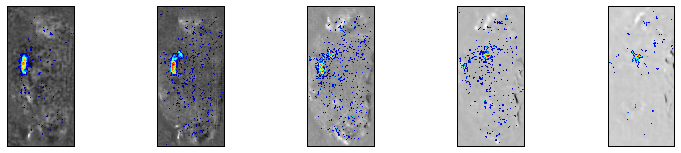

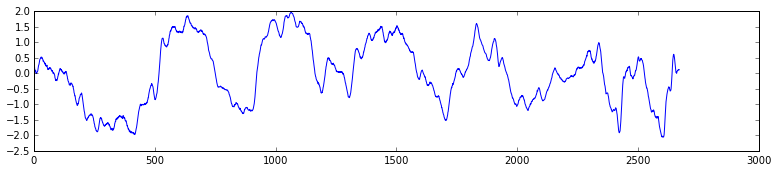

a
16


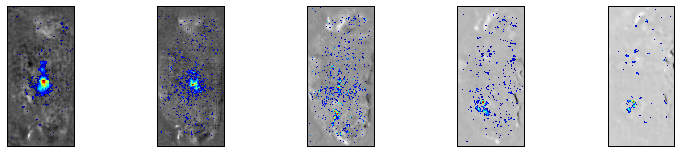

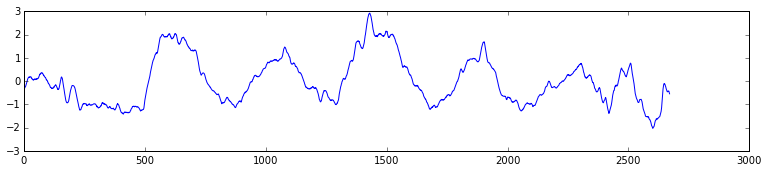

a
17


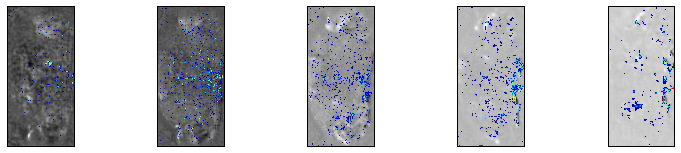

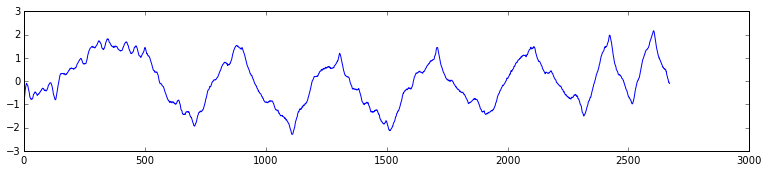


18


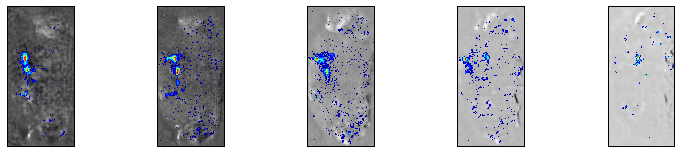

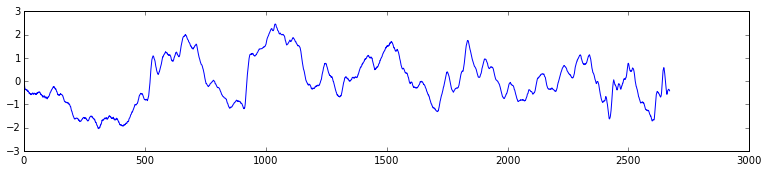

a
19


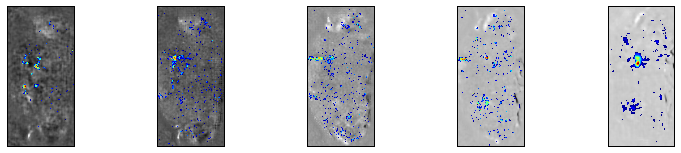

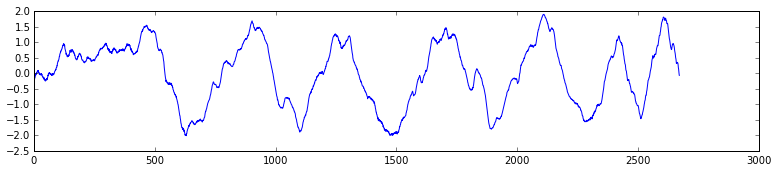

a
20


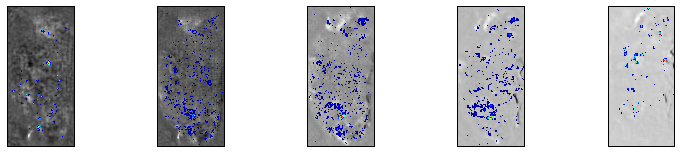

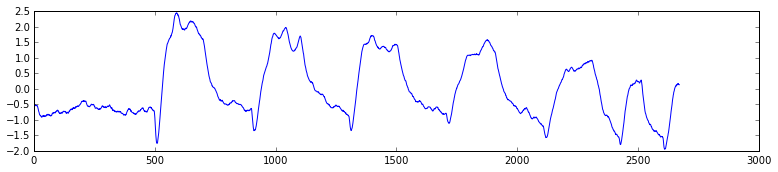


21


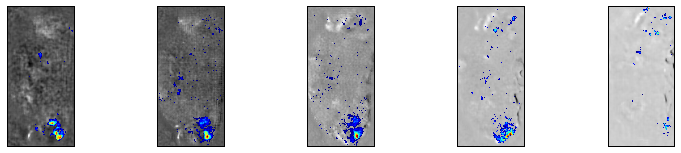

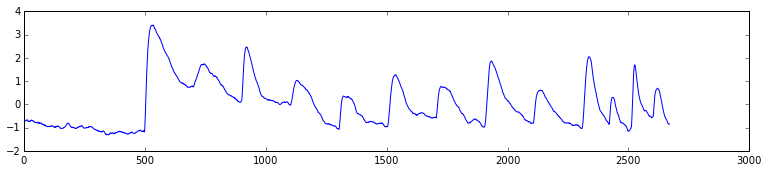

a
22


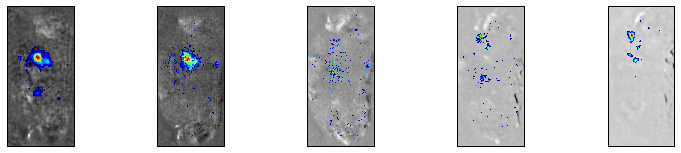

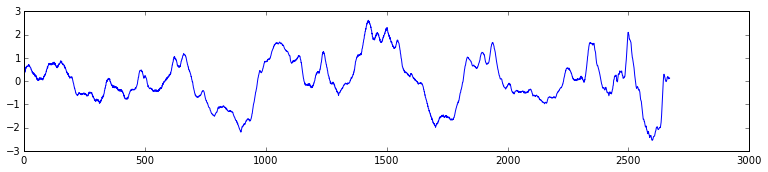

a
23


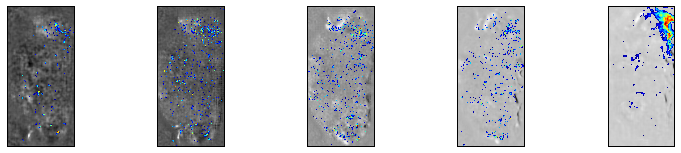

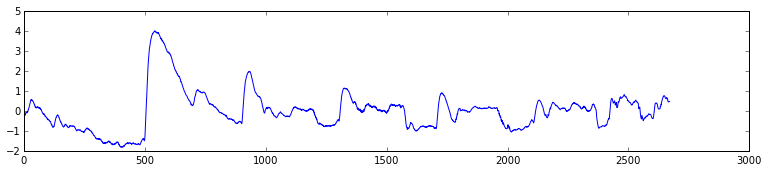


24


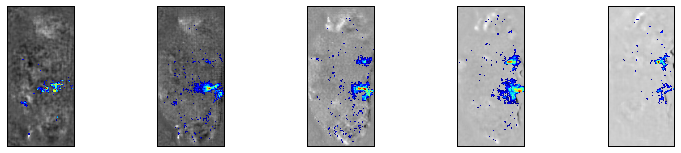

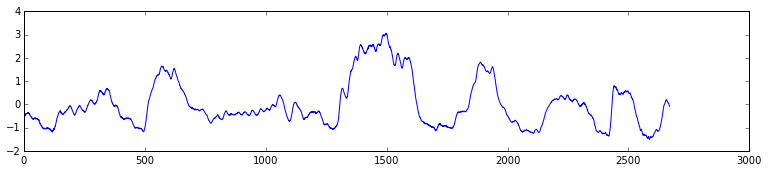

a
25


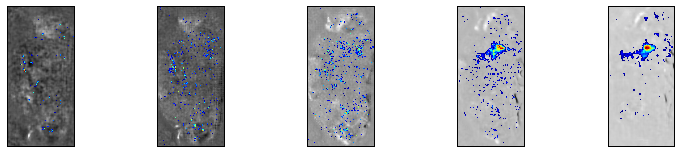

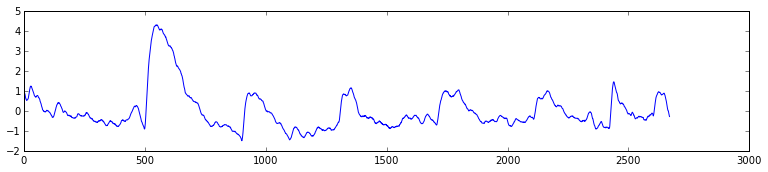

a
26


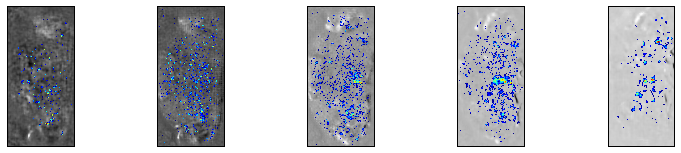

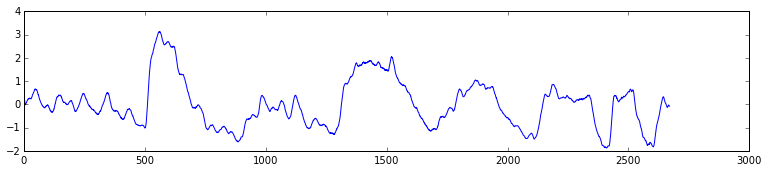


27


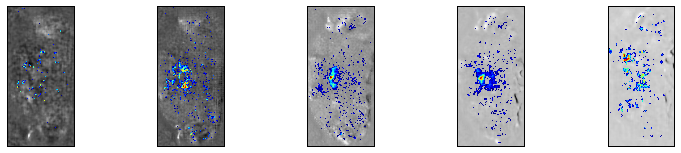

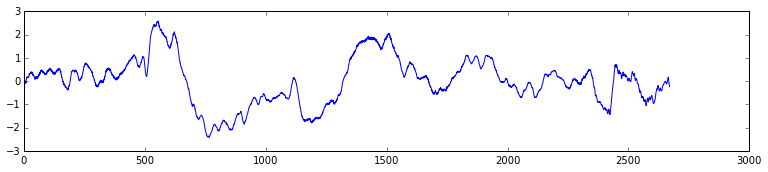

a
28


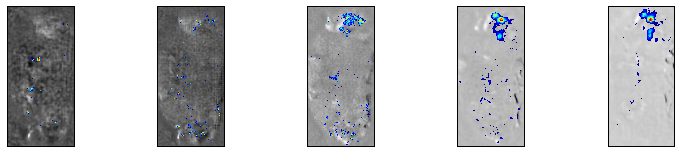

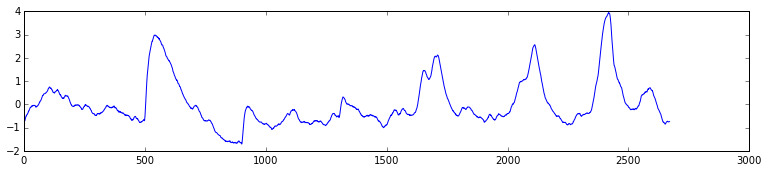

a
29


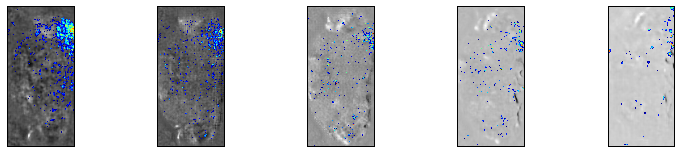

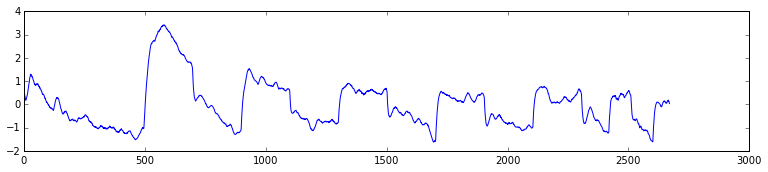


30


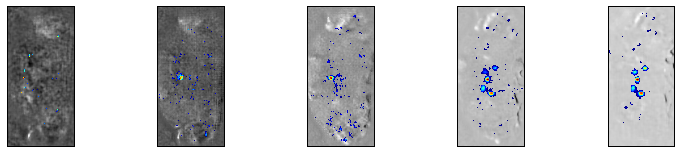

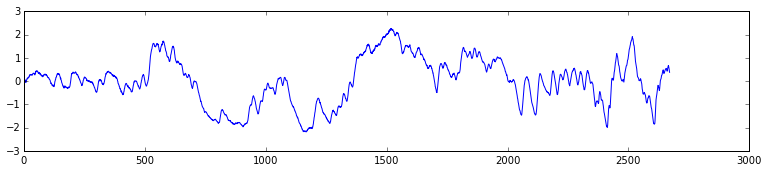

a
31


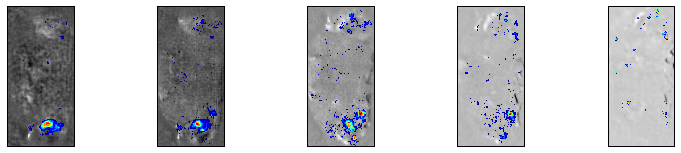

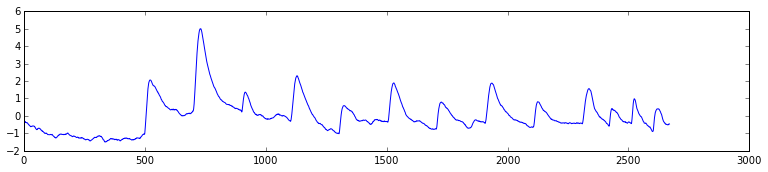

a
32


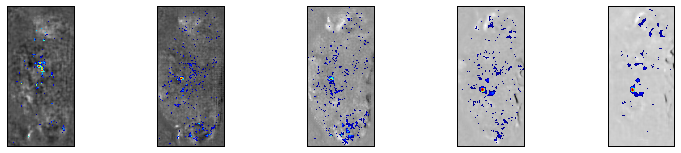

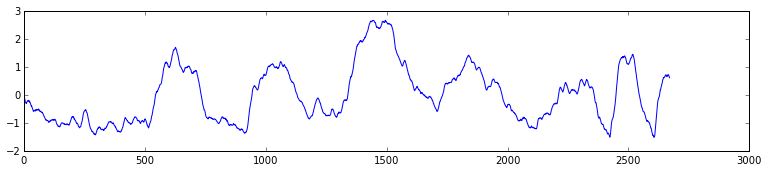


33


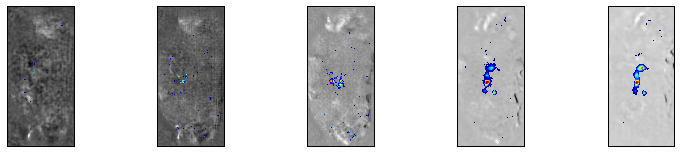

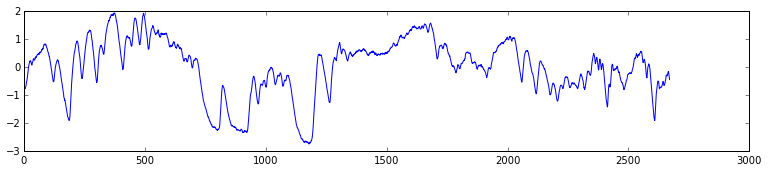

a
34


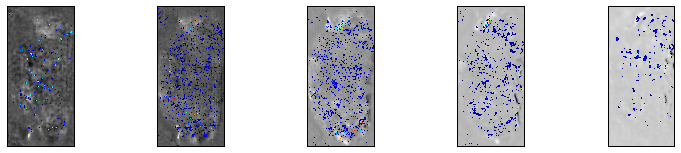

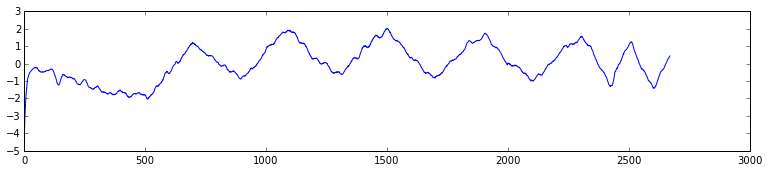


35


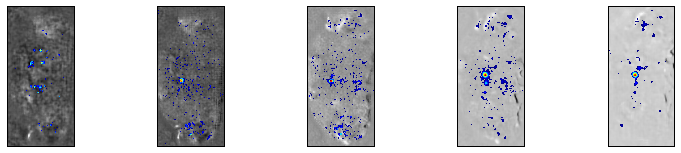

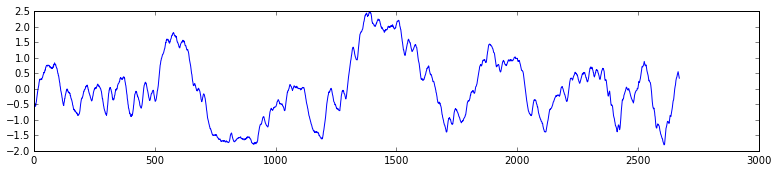

a
36


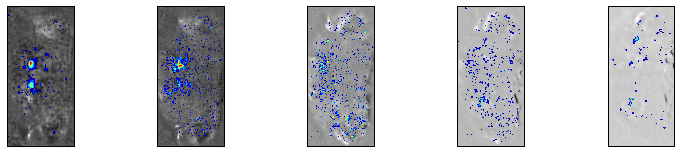

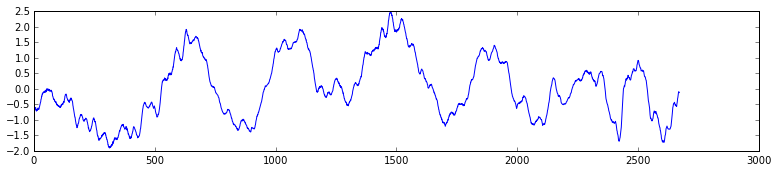

a
37


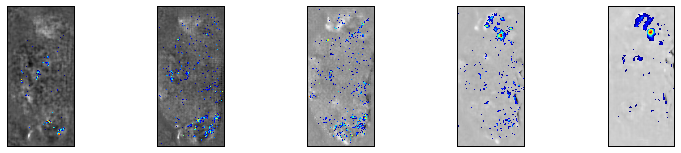

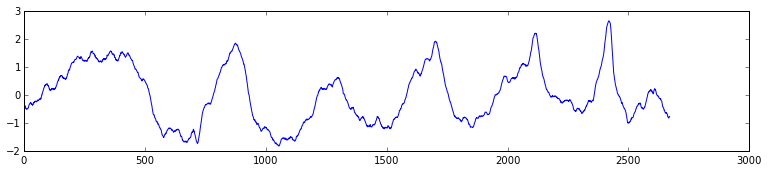


38


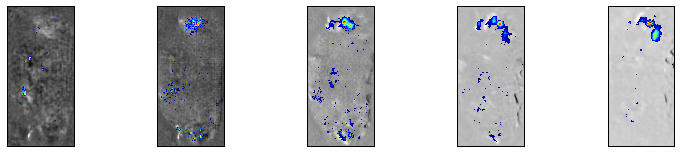

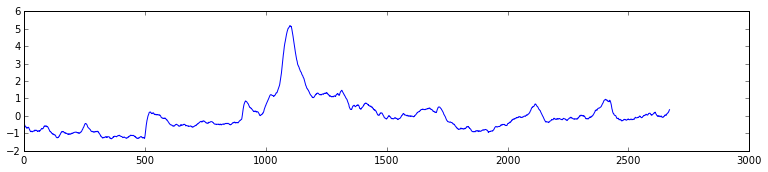

a
39


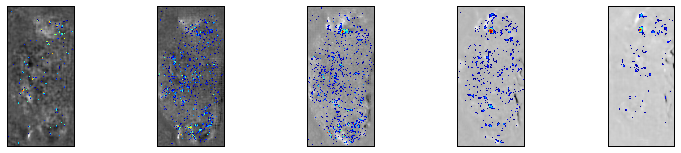

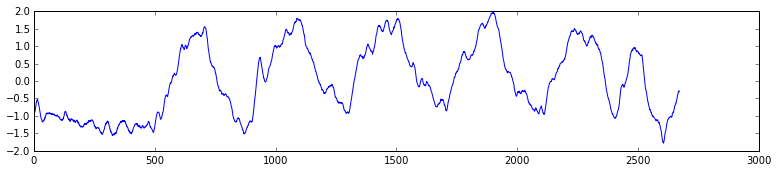


40


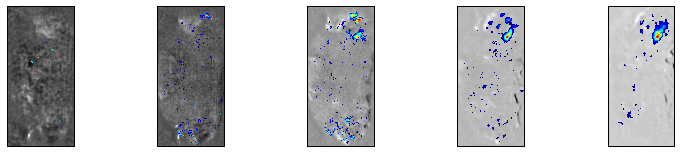

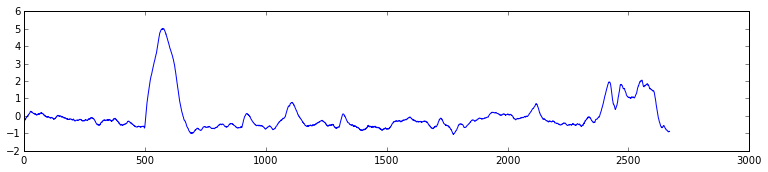

a
41


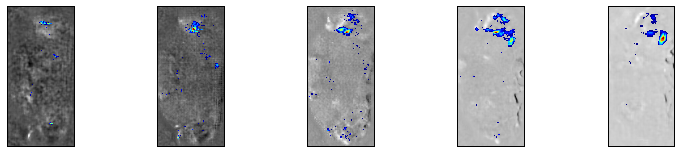

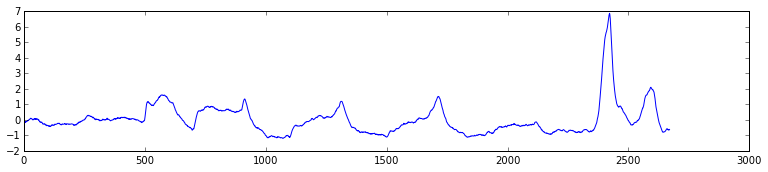

a
42


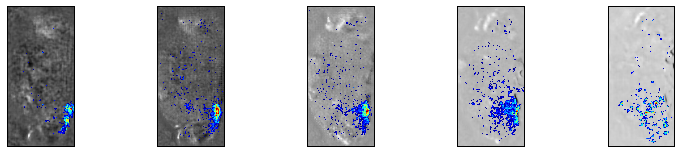

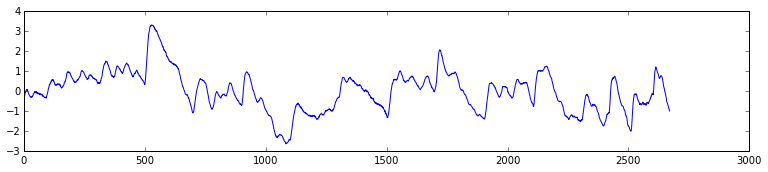


43


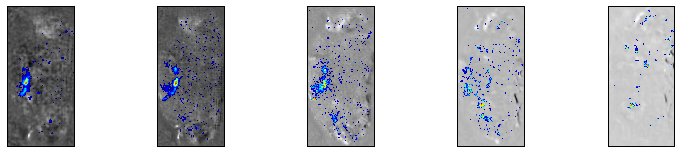

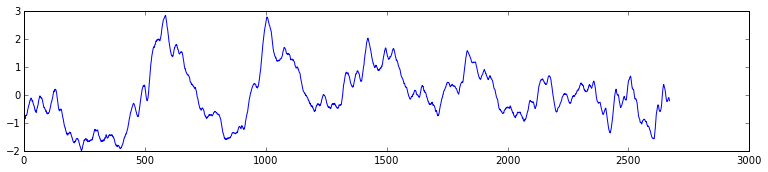

a
44


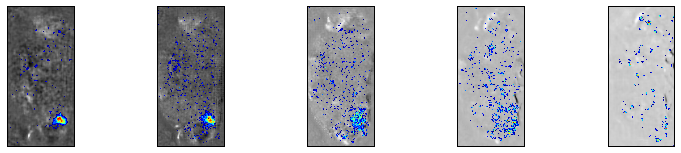

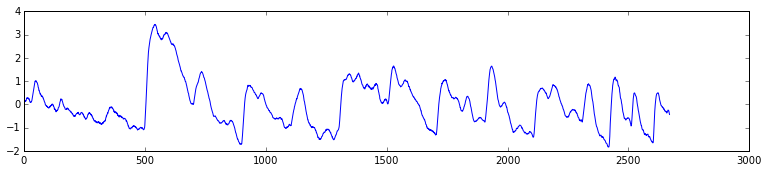

a
45


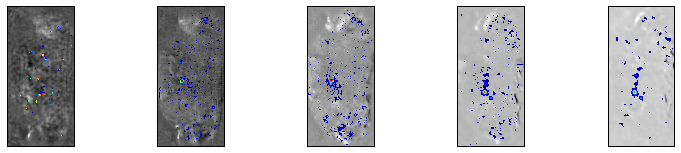

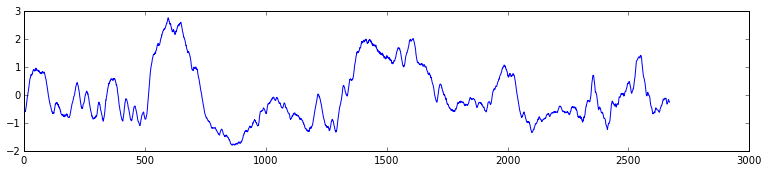

a
46


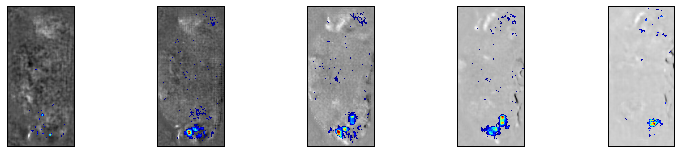

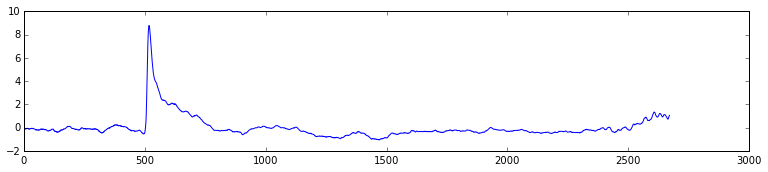

a
47


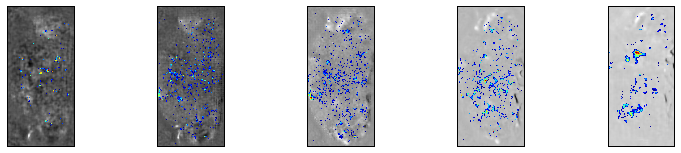

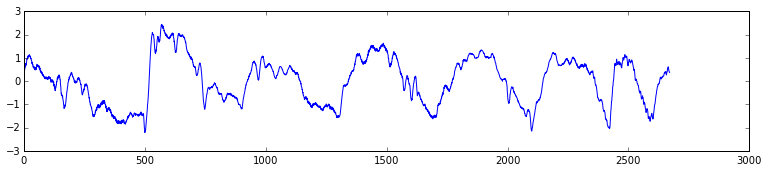


48


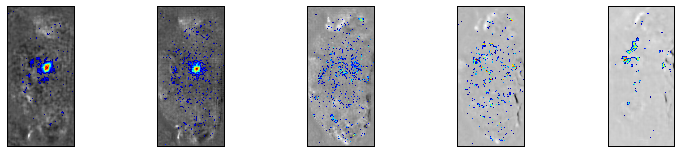

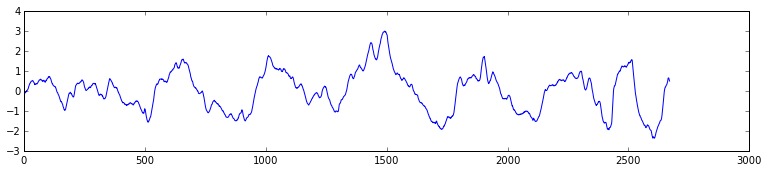

a
49


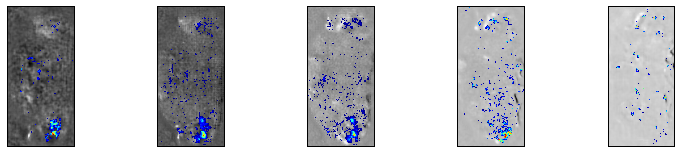

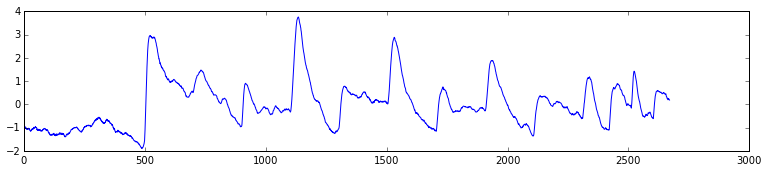

a
50


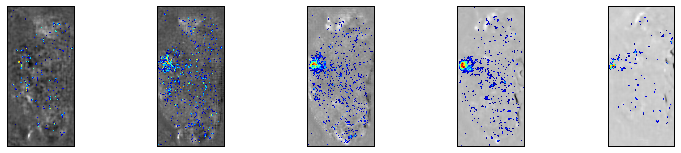

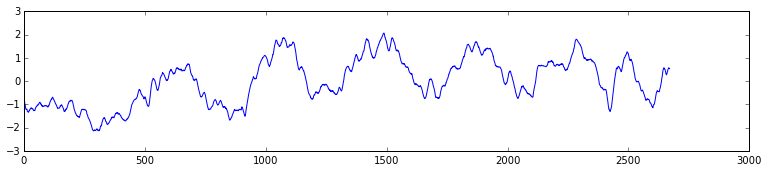

a
51


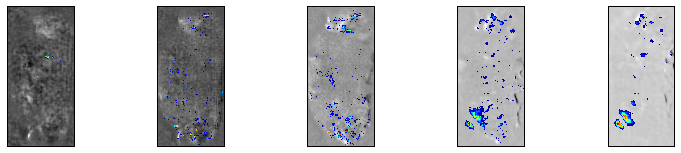

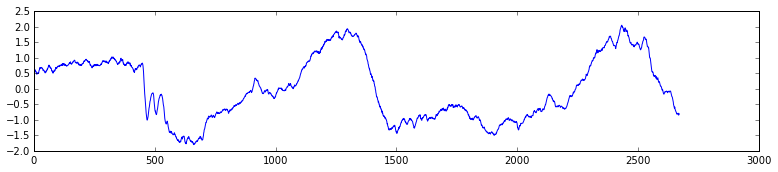


52


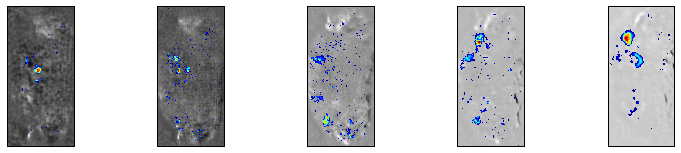

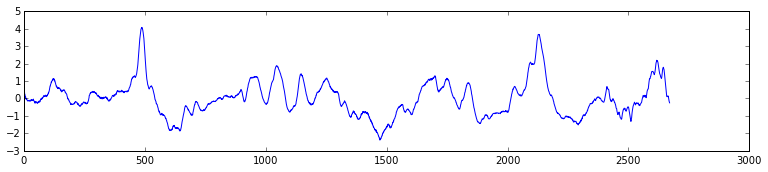

a
53


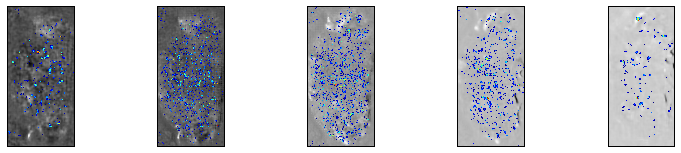

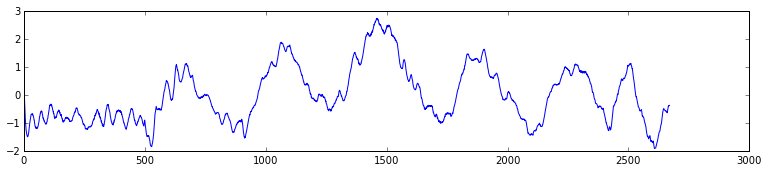


54


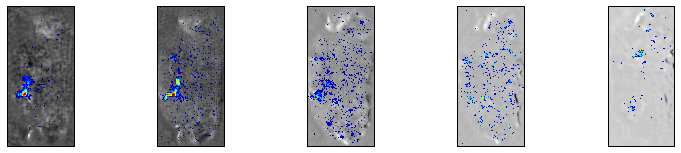

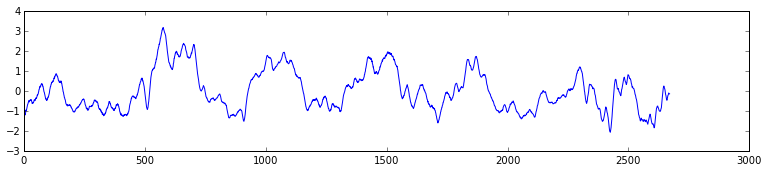

a
55


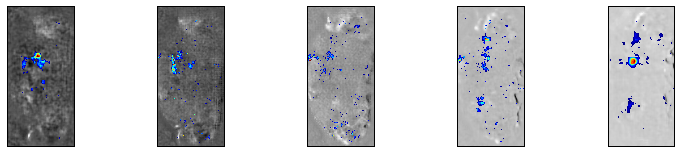

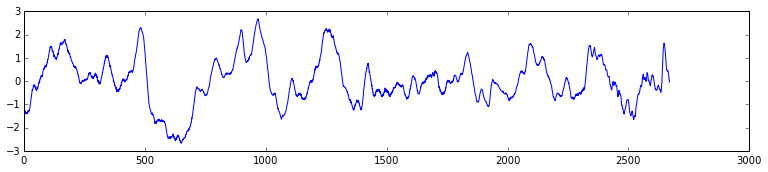

a
56


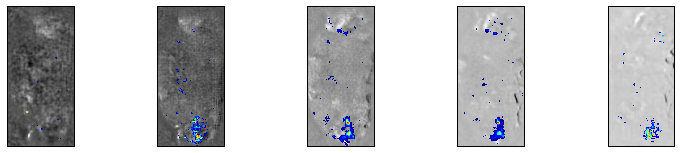

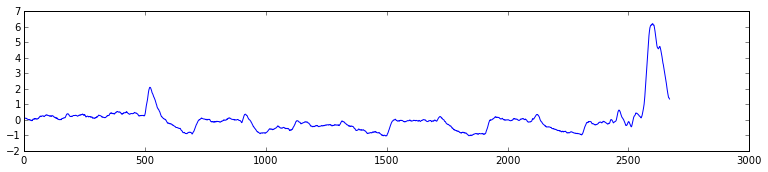

a
57


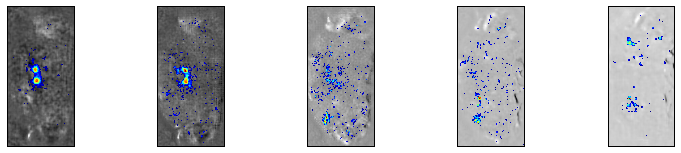

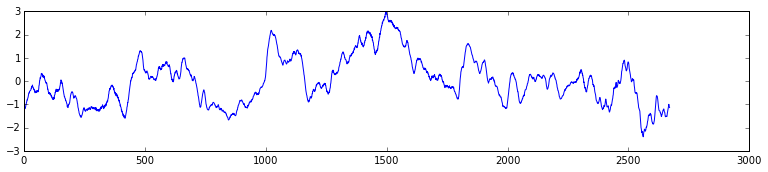

a
58


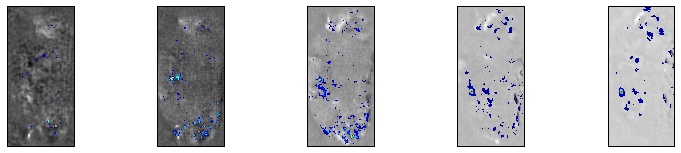

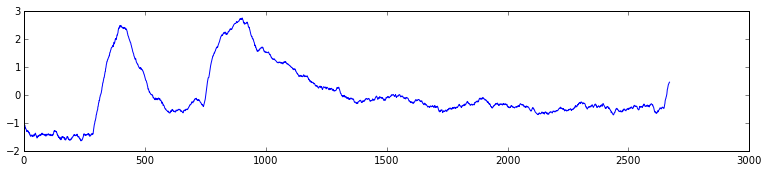


59


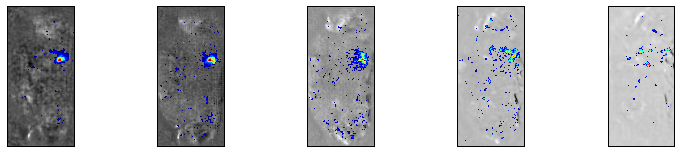

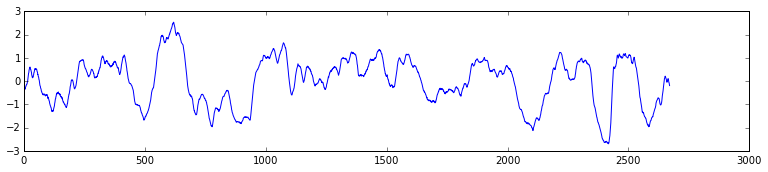

a
60


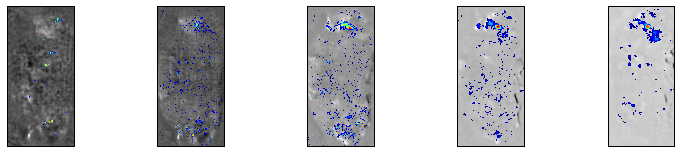

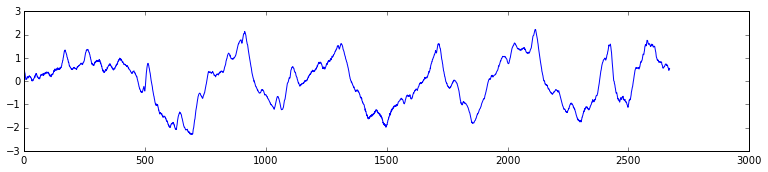

a
61


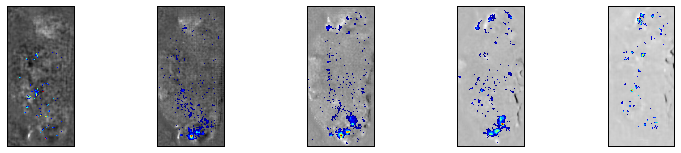

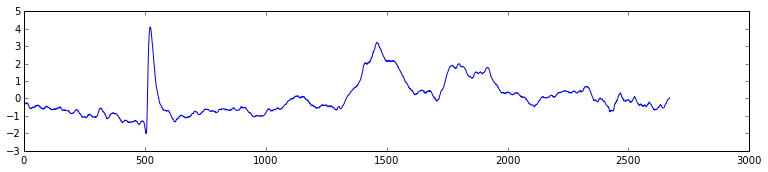

a
62


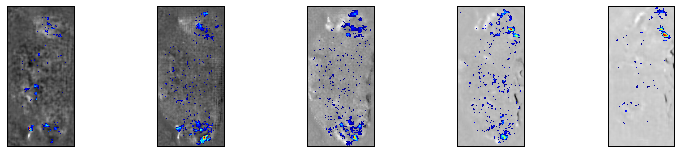

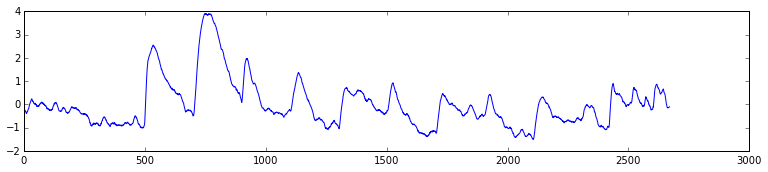

a
63


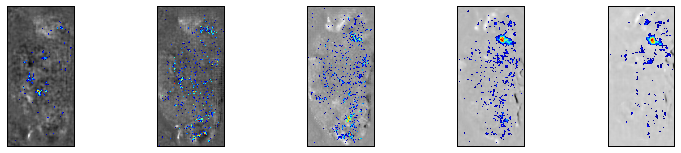

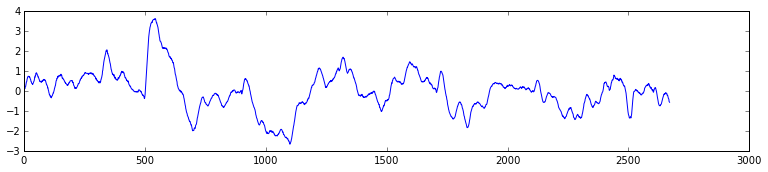


64


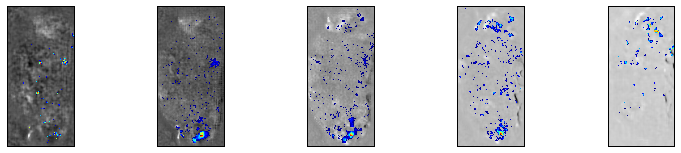

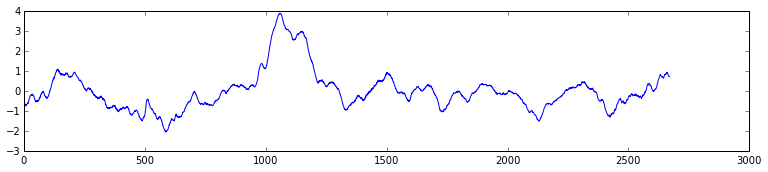

a
65


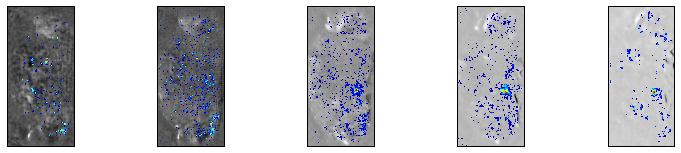

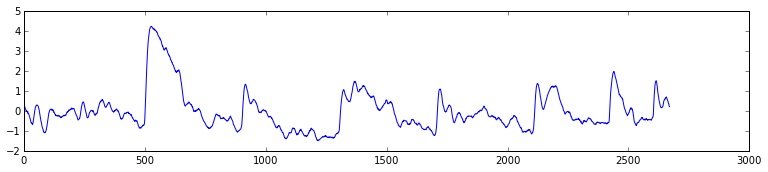

a
66


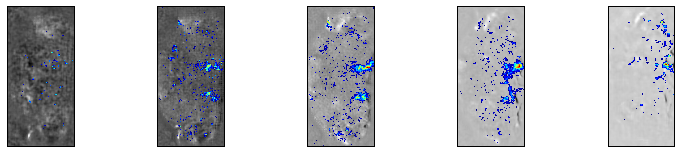

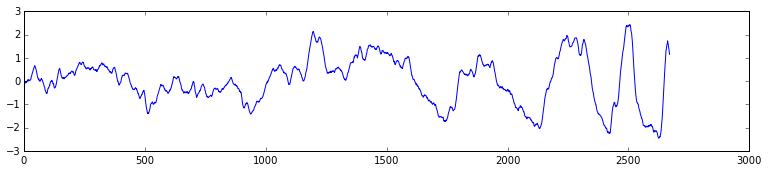

a
67


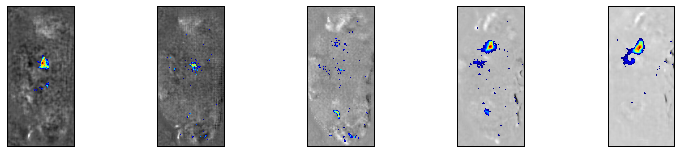

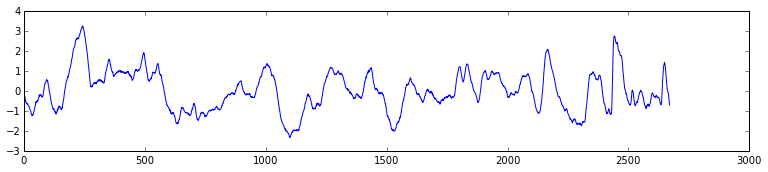

a
68


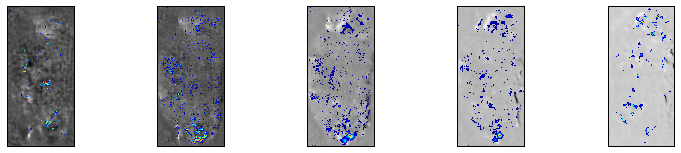

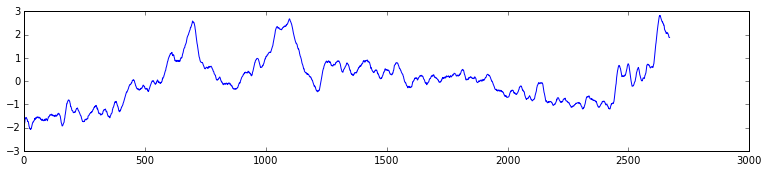

a
69


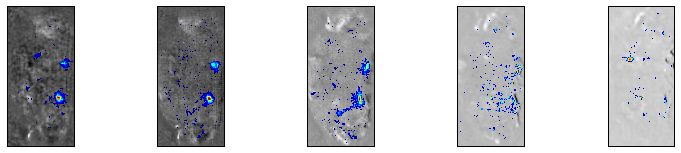

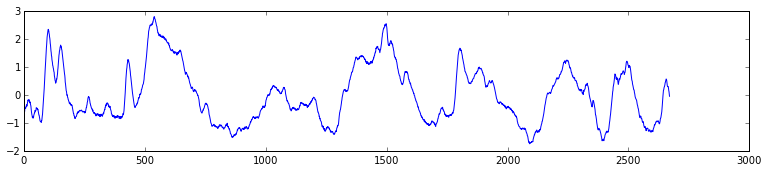

a
70


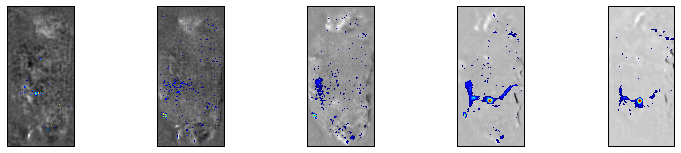

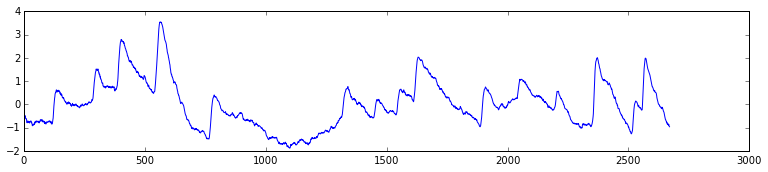

a
71


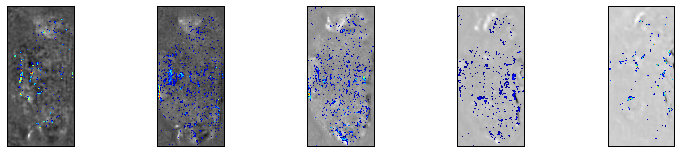

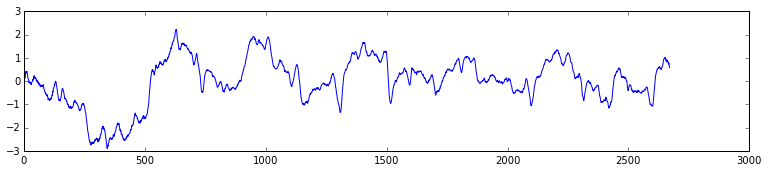


72


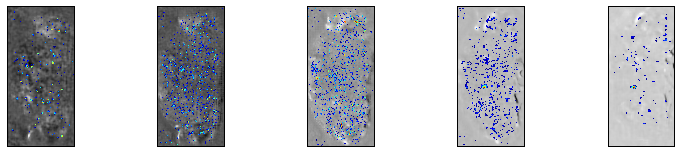

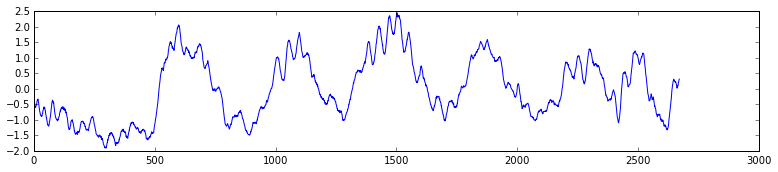


73


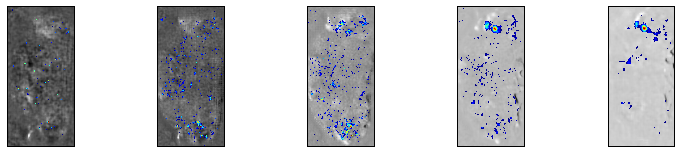

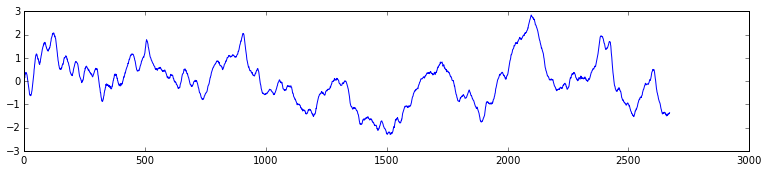

a
74


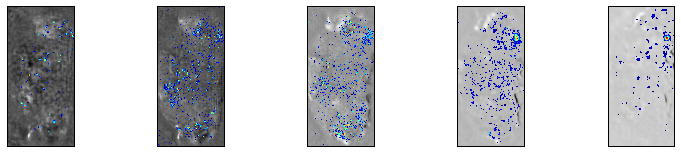

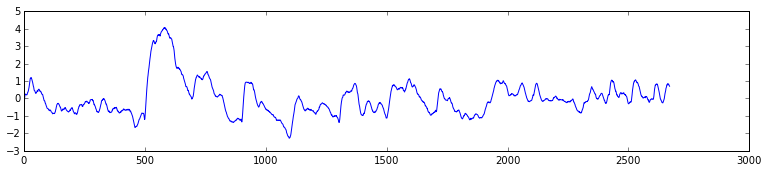


75


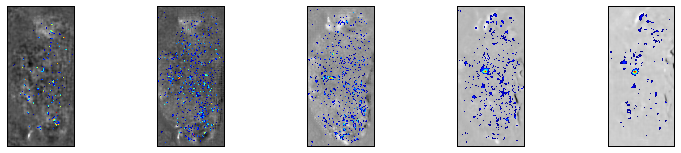

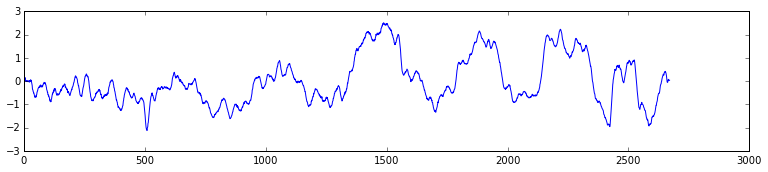


76


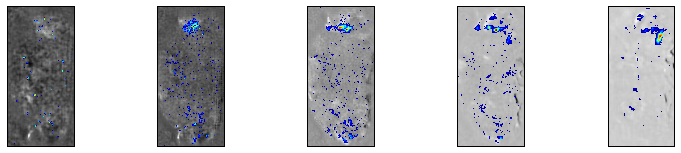

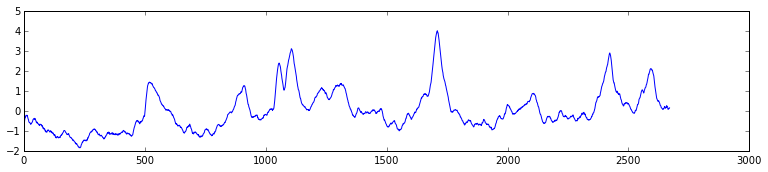

a
77


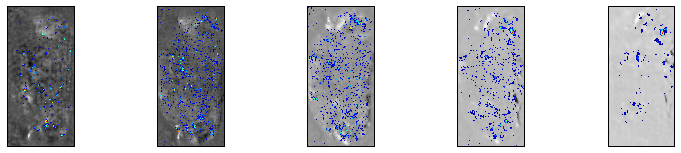

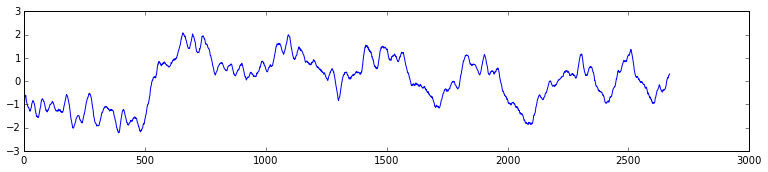


78


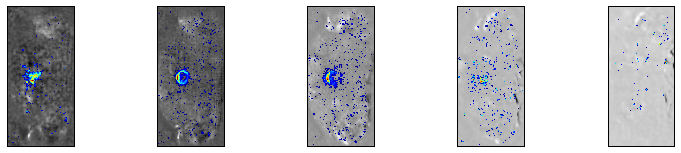

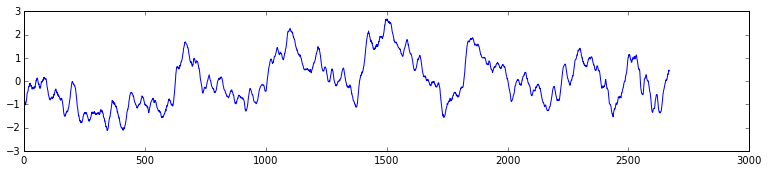

a
79


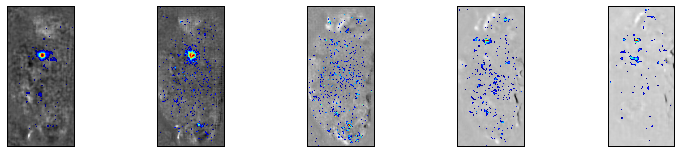

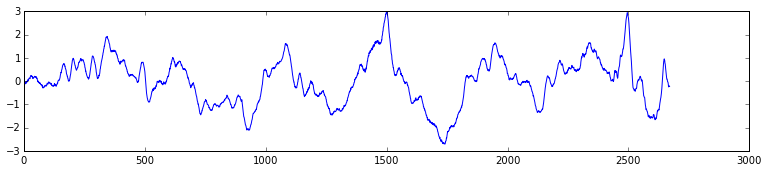

a
80


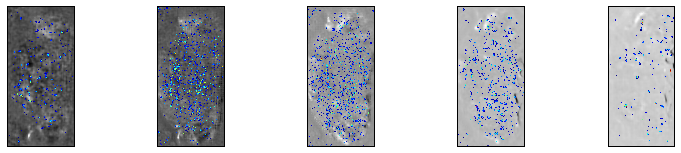

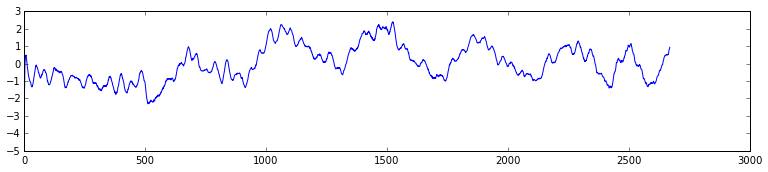


81


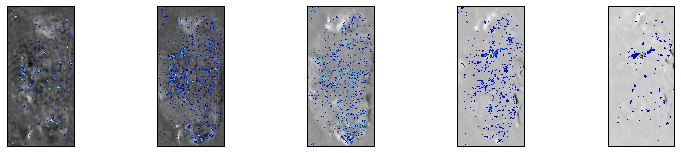

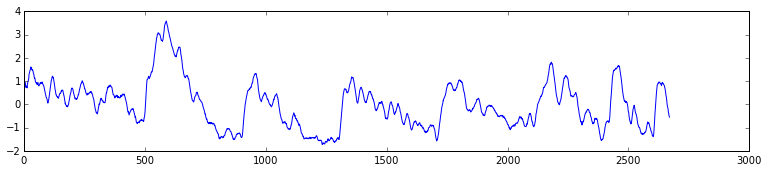


82


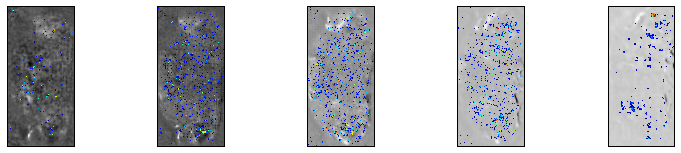

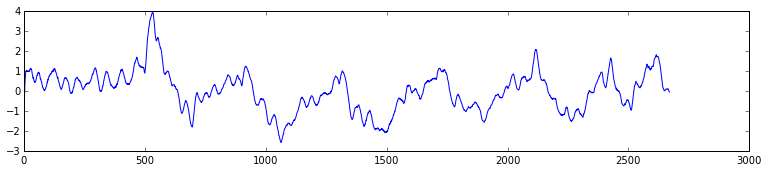


83


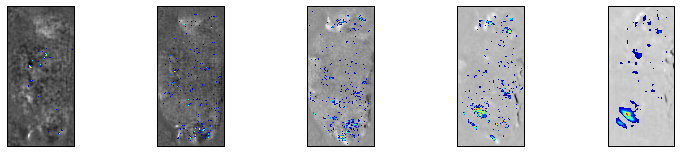

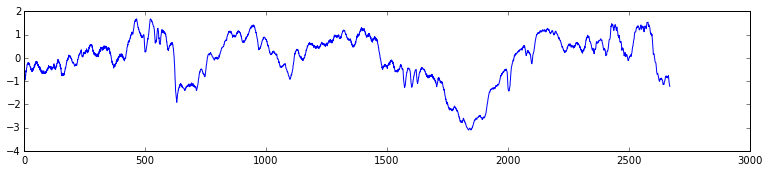


84


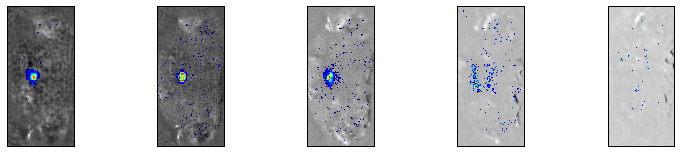

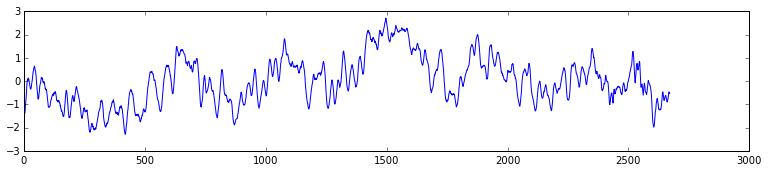

a
85


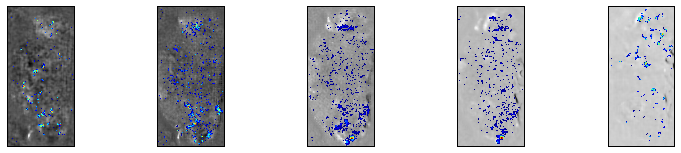

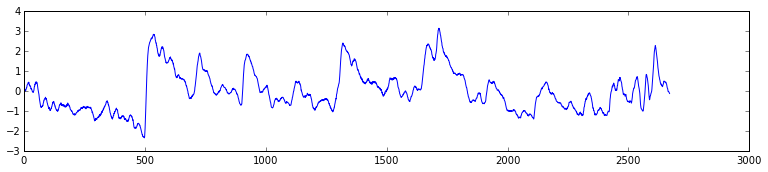


86


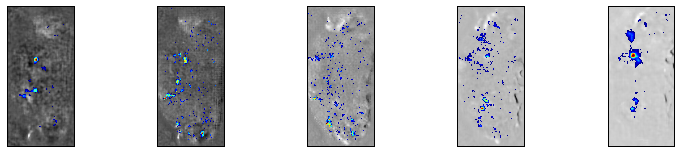

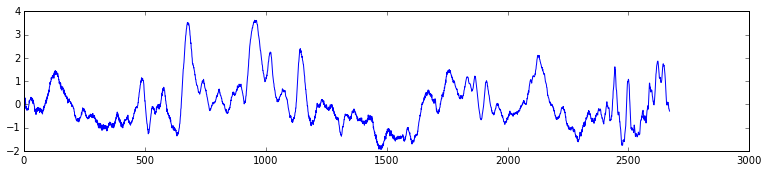

a
87


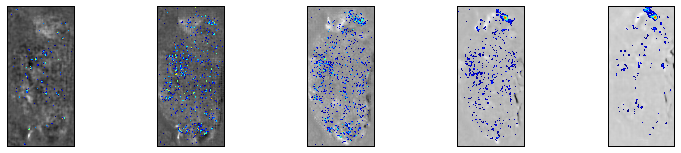

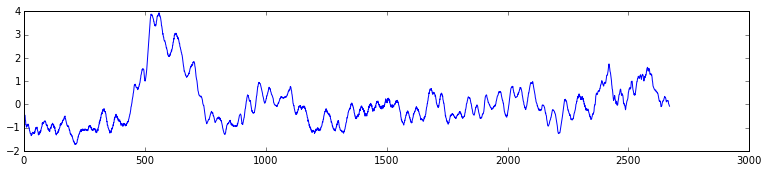


88


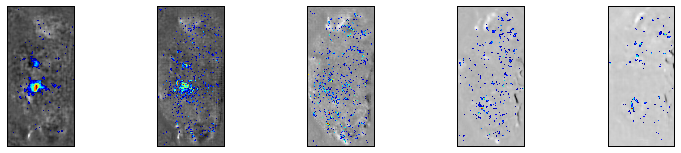

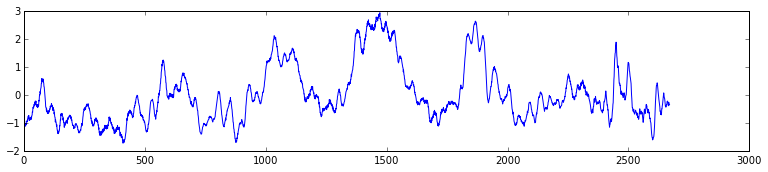

a
89


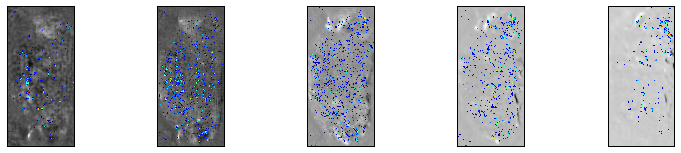

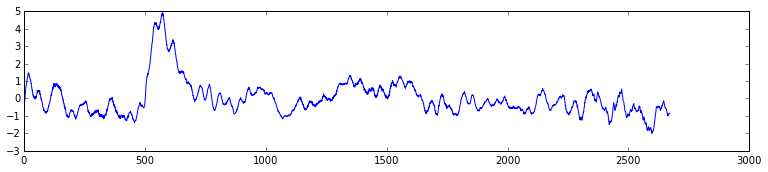


90


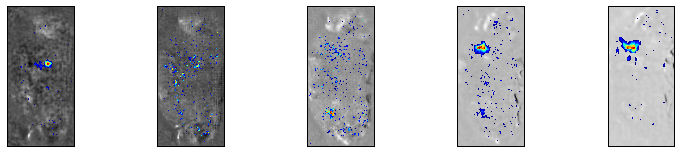

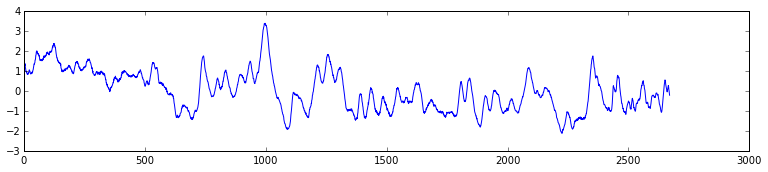

a
91


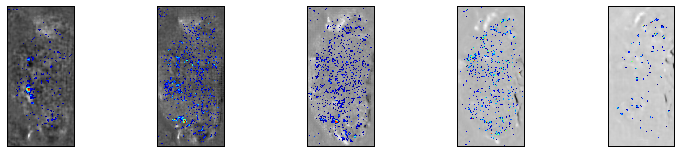

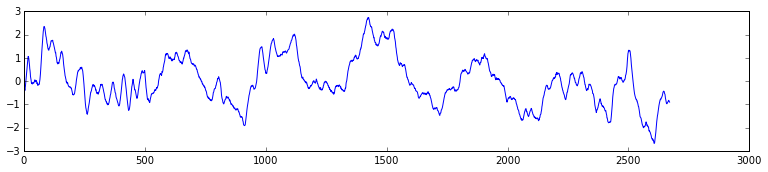


92


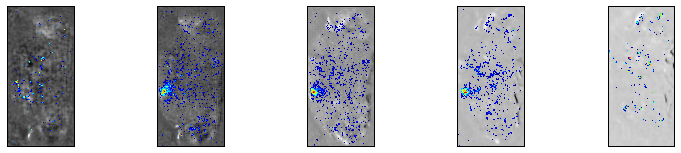

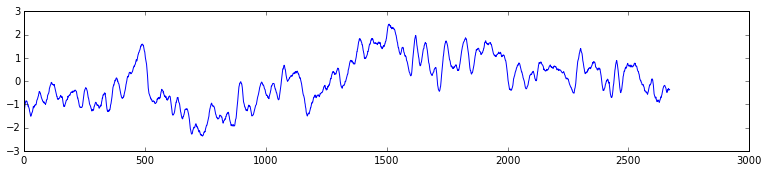

a
93


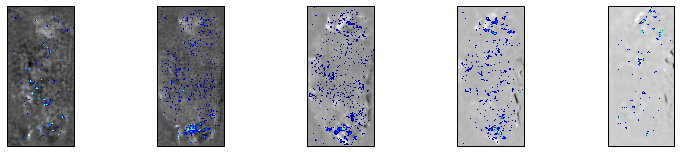

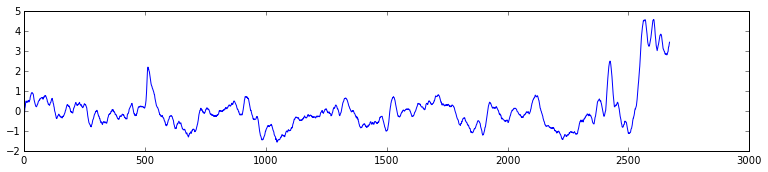


94


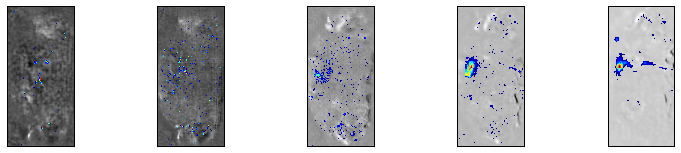

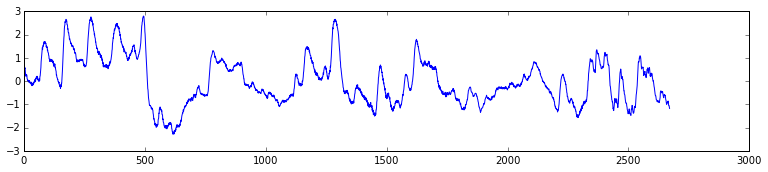

a
95


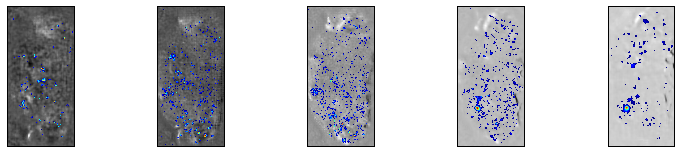

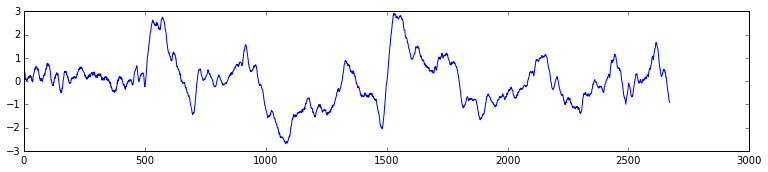


96


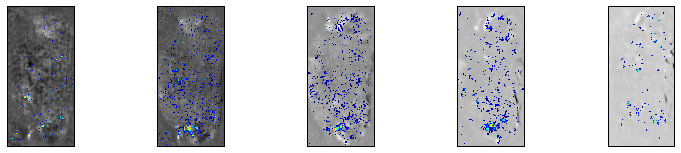

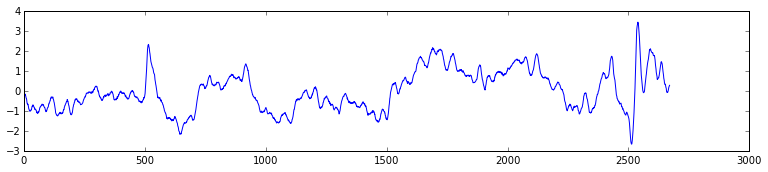


97


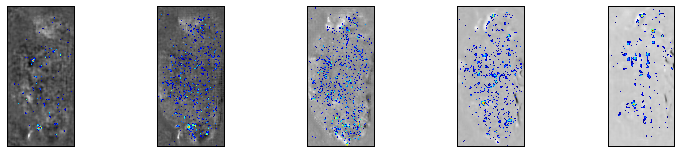

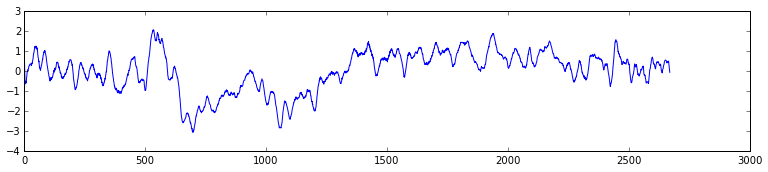


98


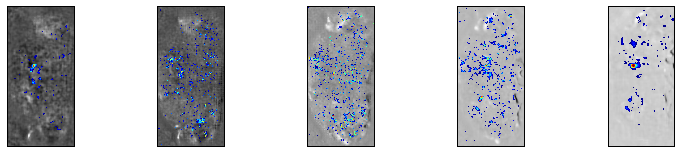

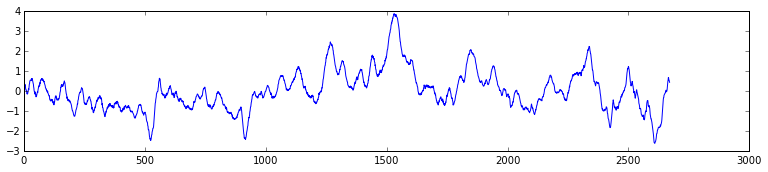


99


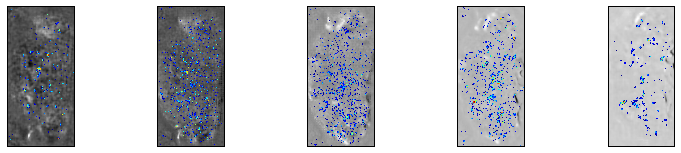

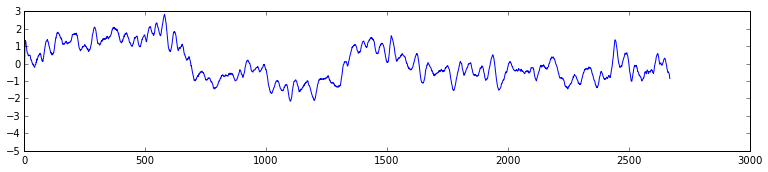


100


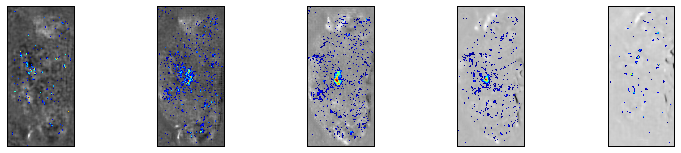

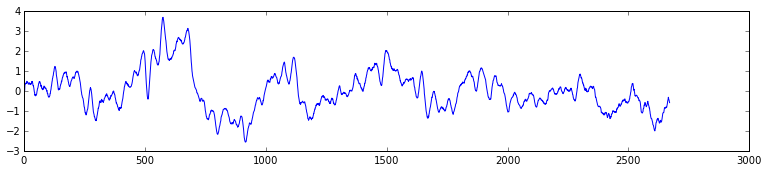

a
101


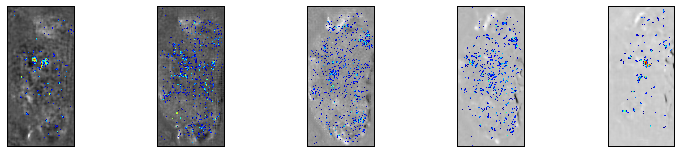

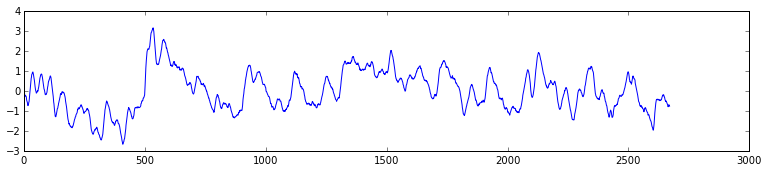


102


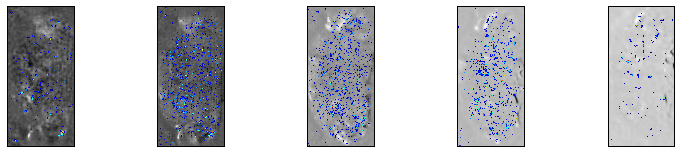

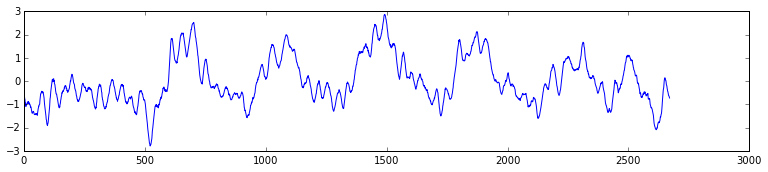


103


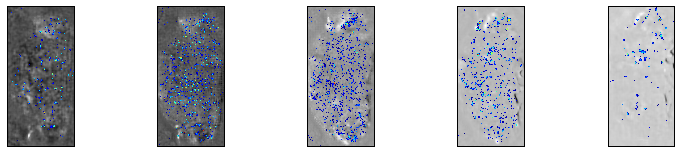

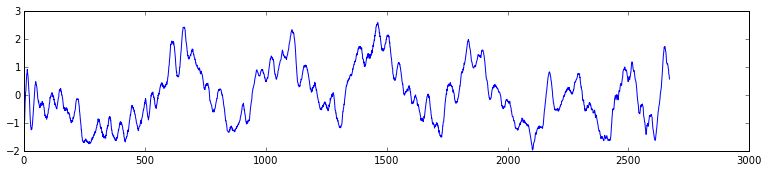


104


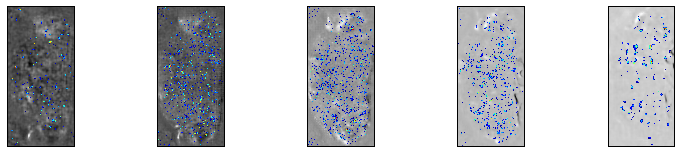

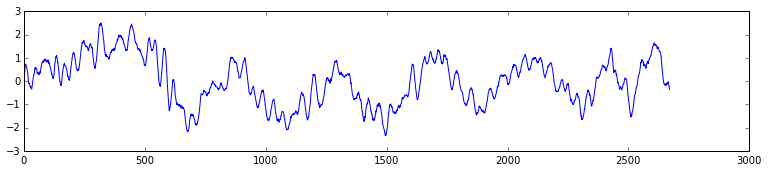


105


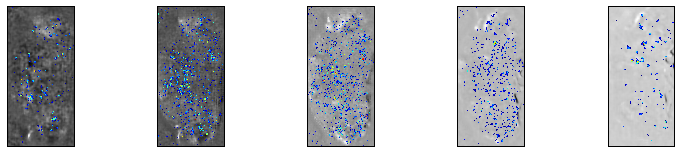

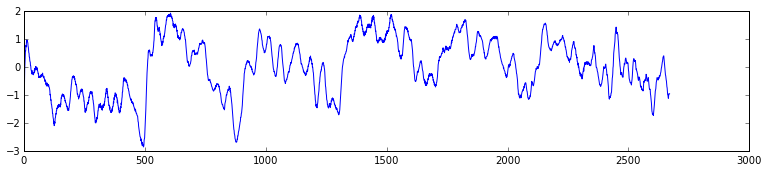


106


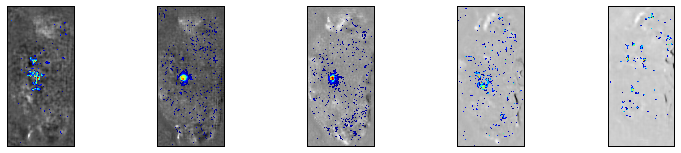

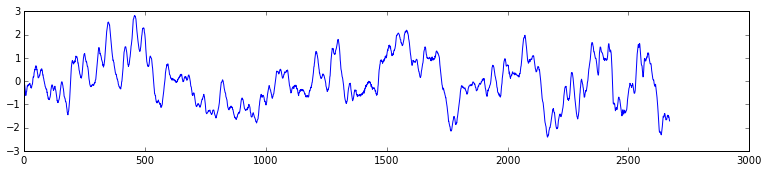

a
107


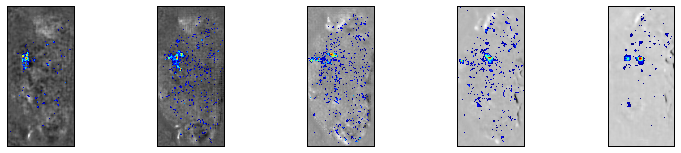

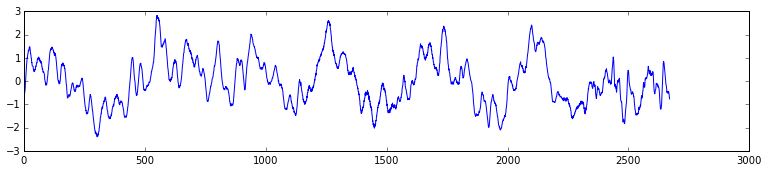

a
108


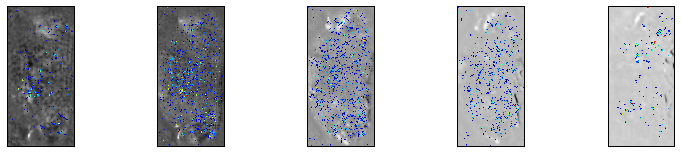

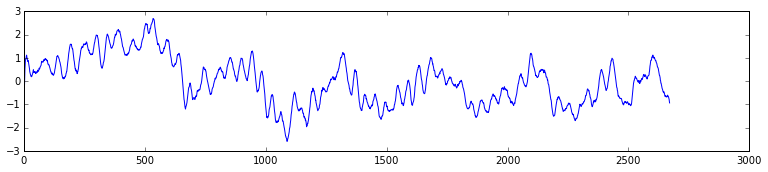


109


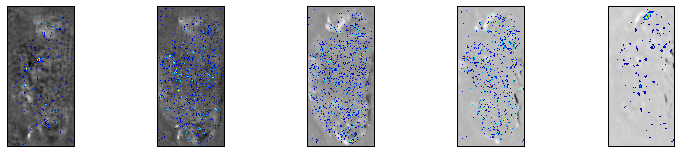

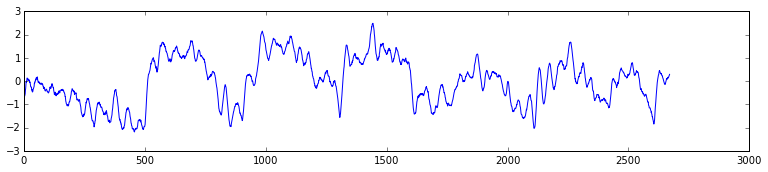


110


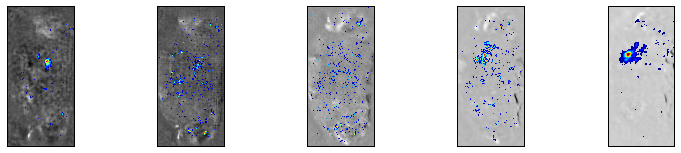

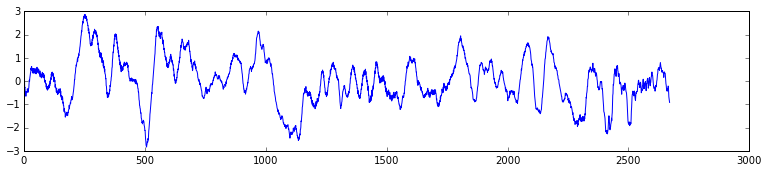

a
111


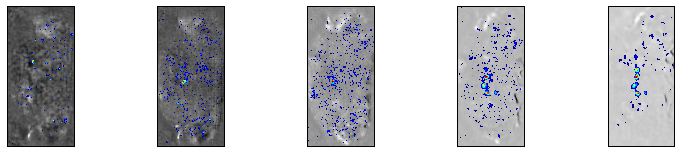

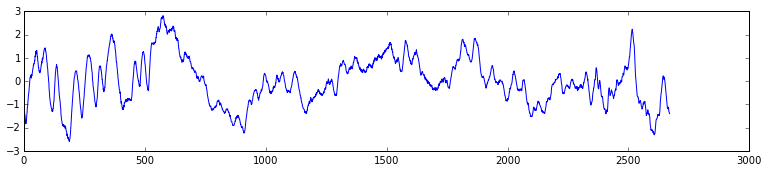

a
112


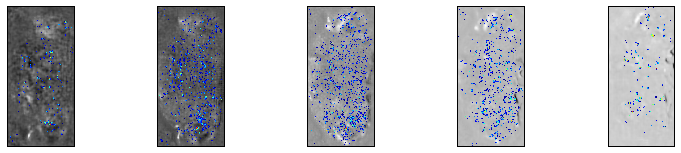

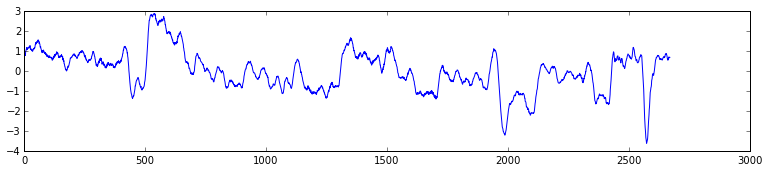


113


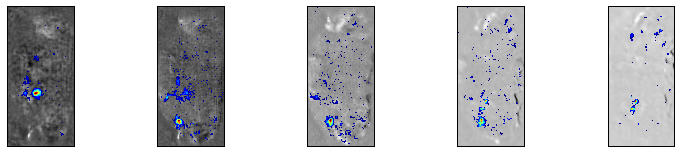

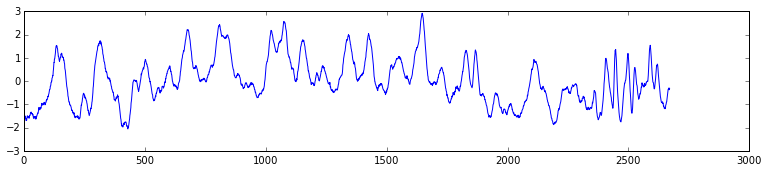

a
114


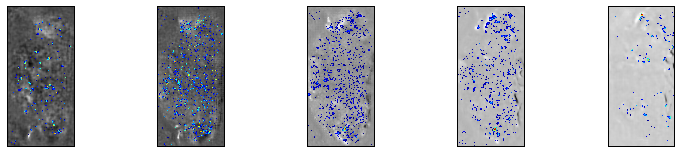

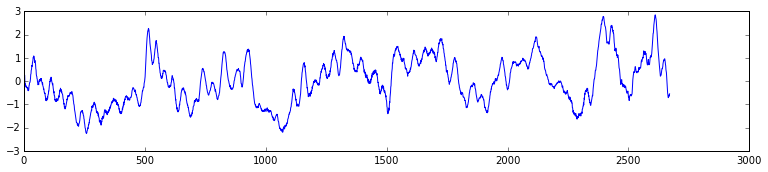


115


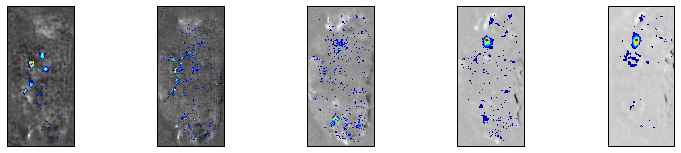

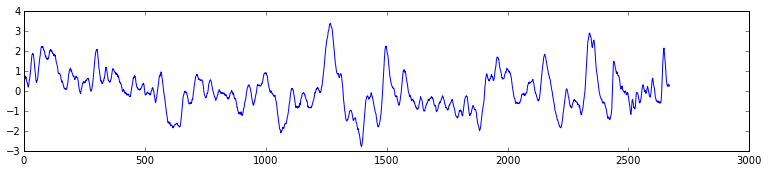

a
116


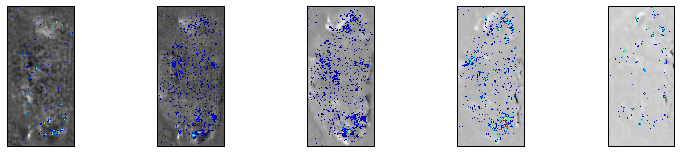

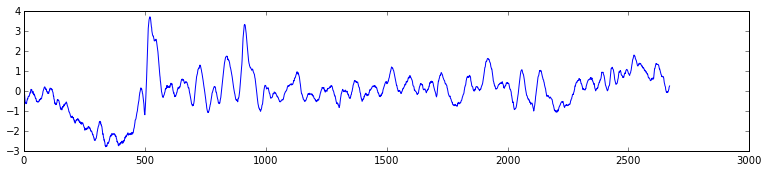


117


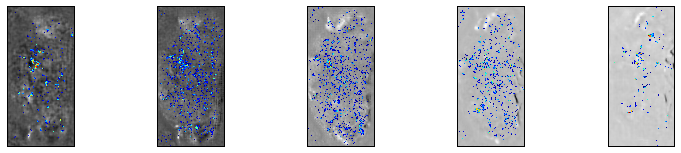

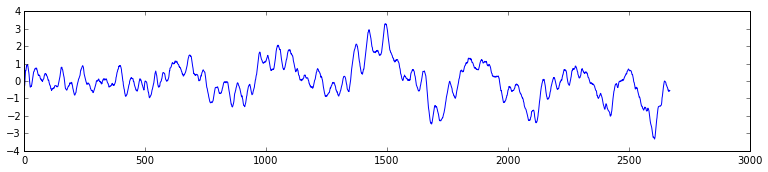


118


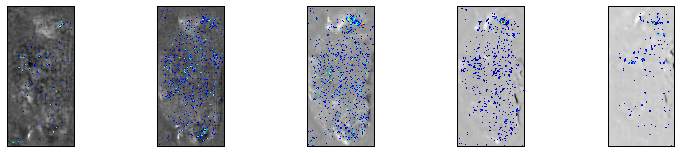

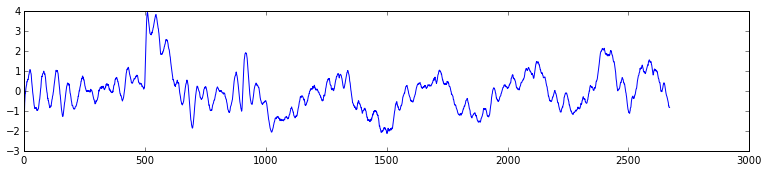


119


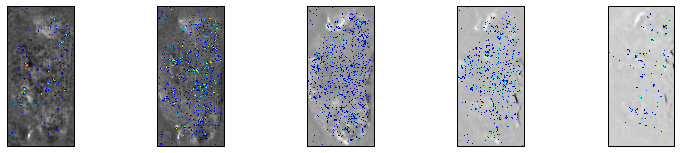

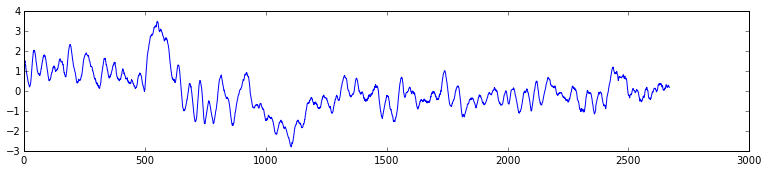


120


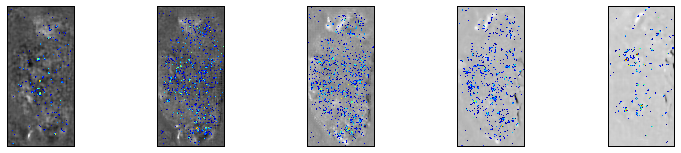

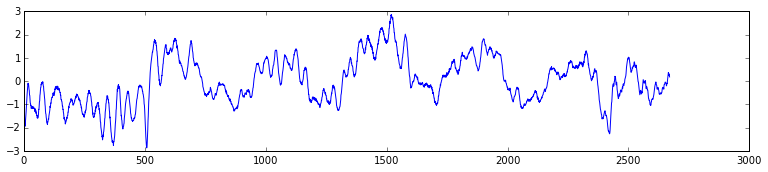


121


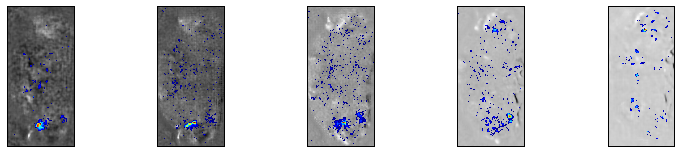

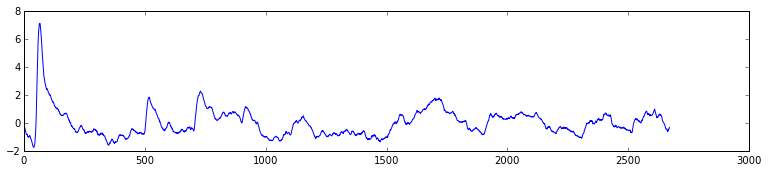

a
122


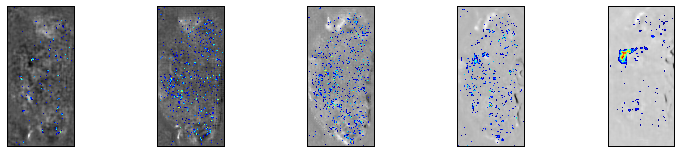

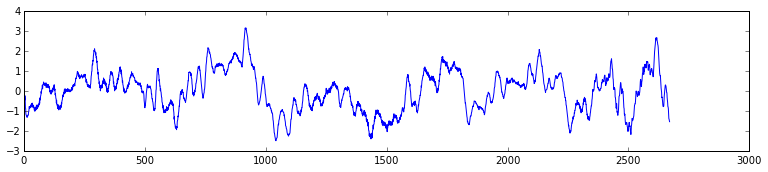


123


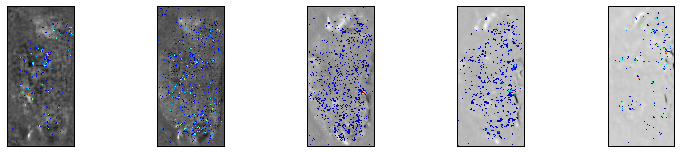

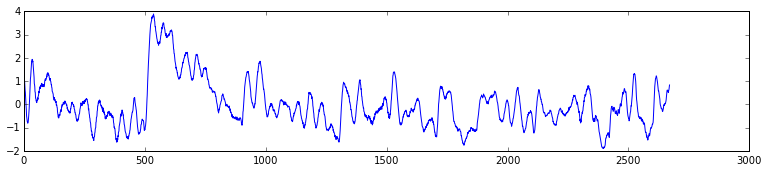


124


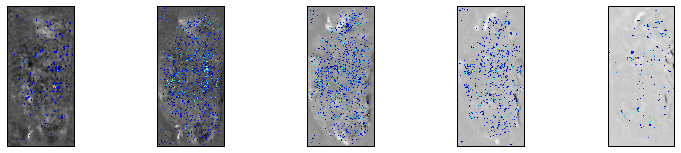

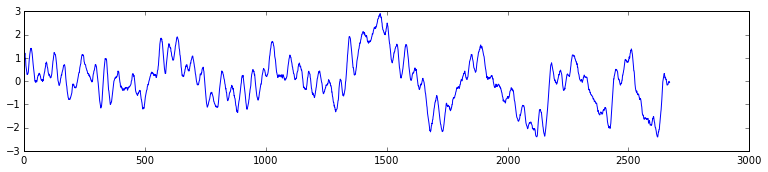


125


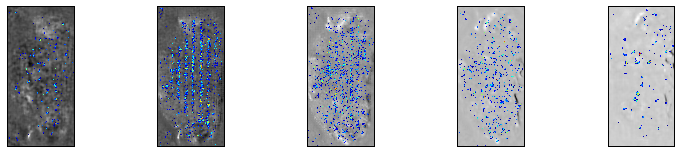

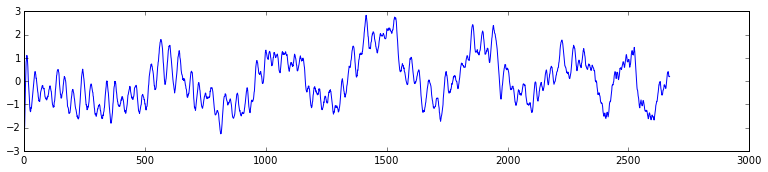


126


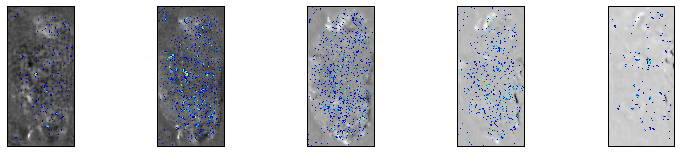

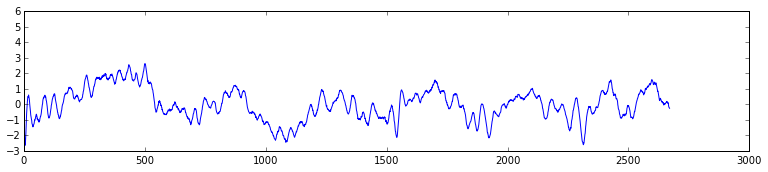


127


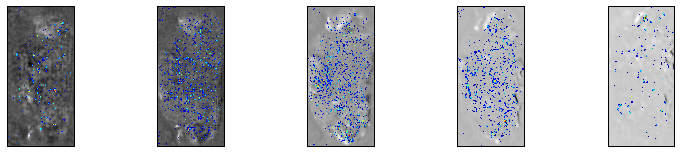

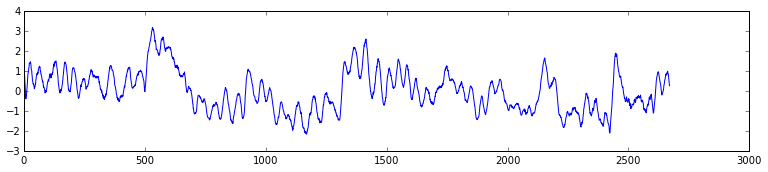


128


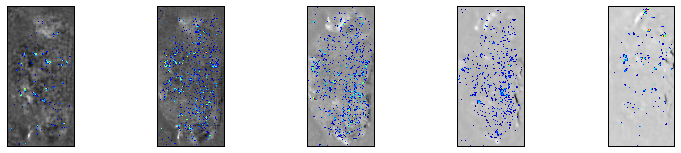

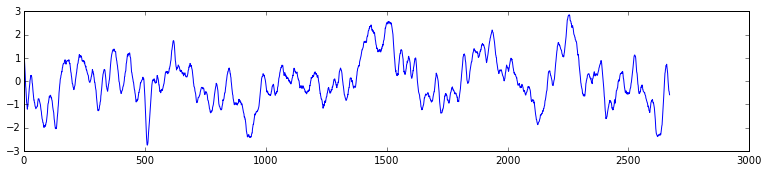


129


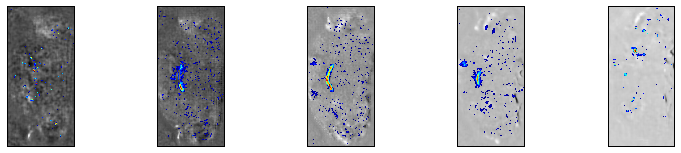

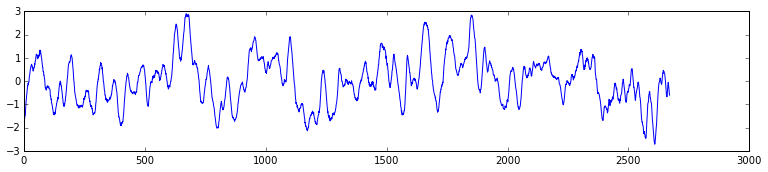

a
130


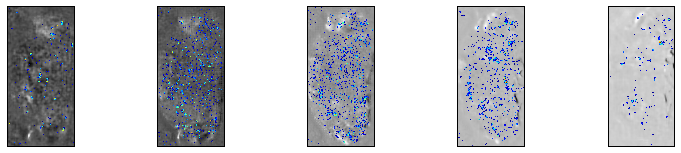

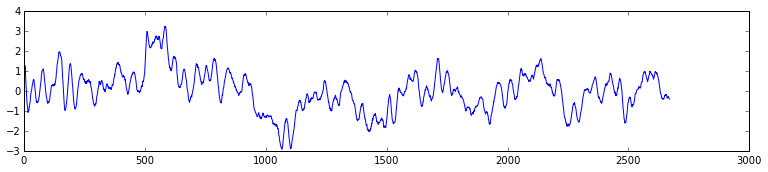


131


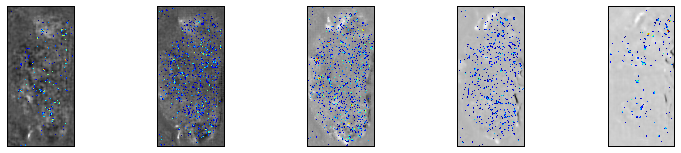

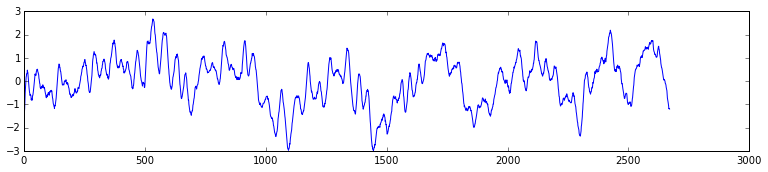


132


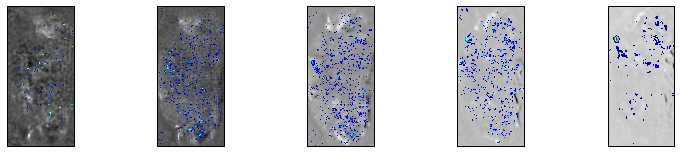

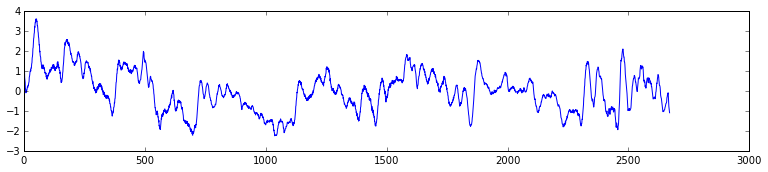

a
133


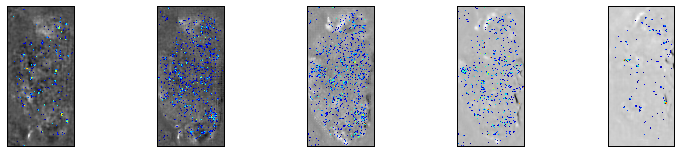

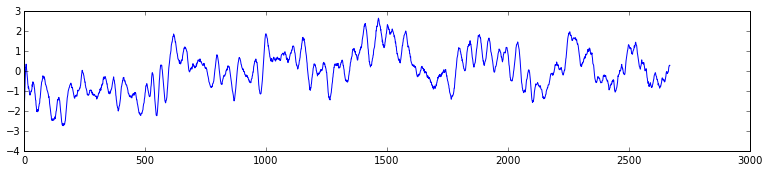


134


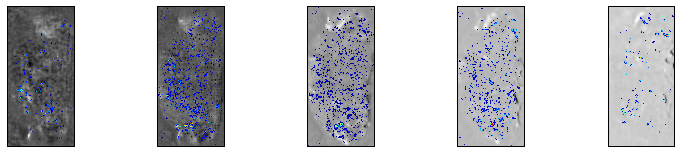

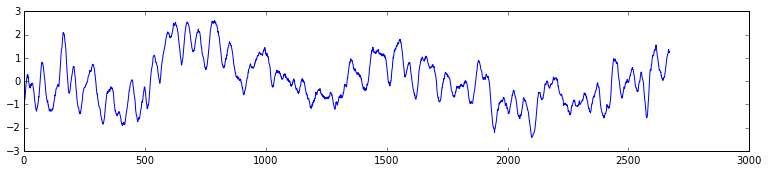


135


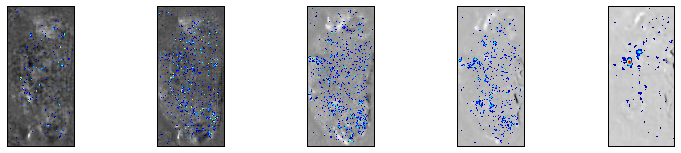

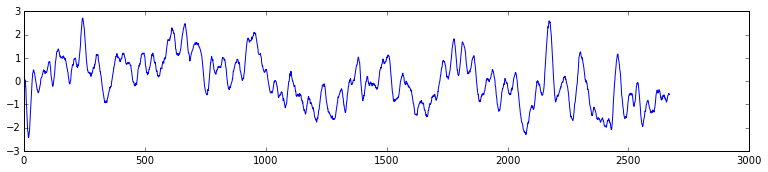


136


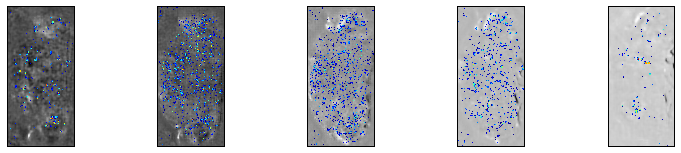

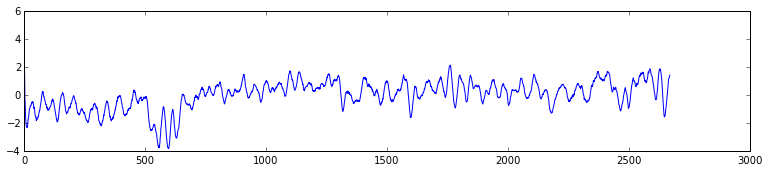


137


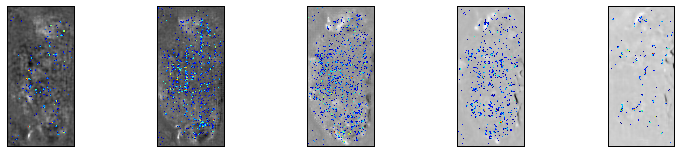

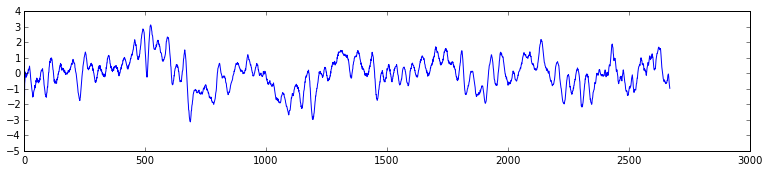


138


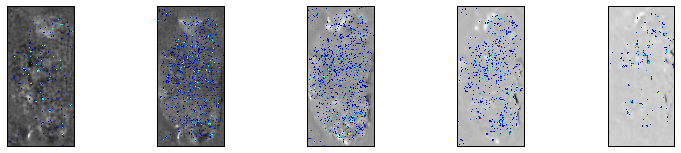

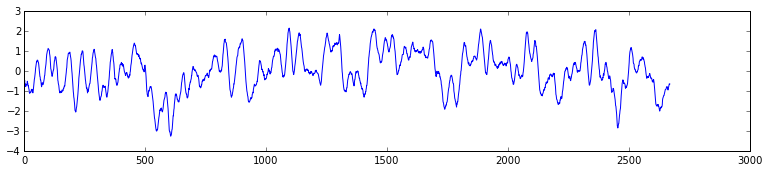


139


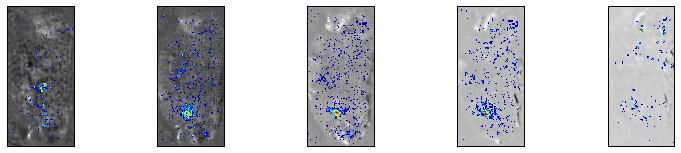

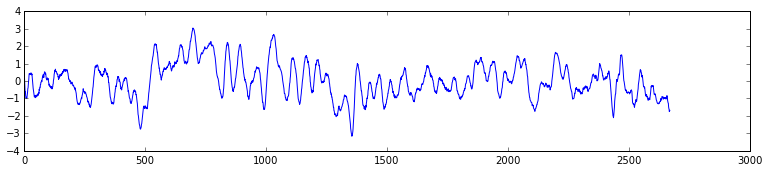

a
140


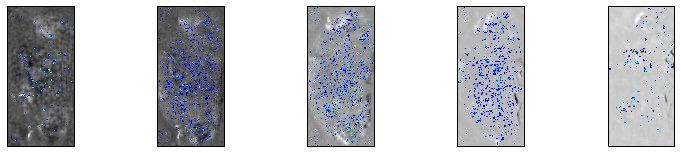

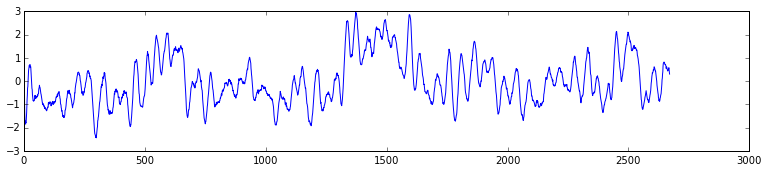


141


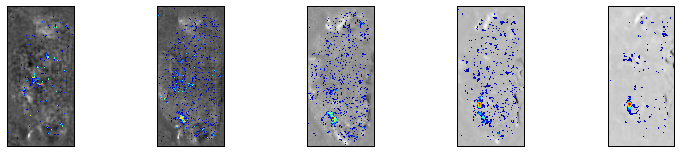

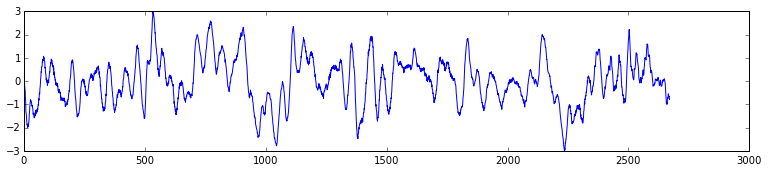

a
142


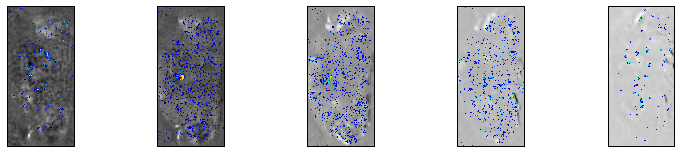

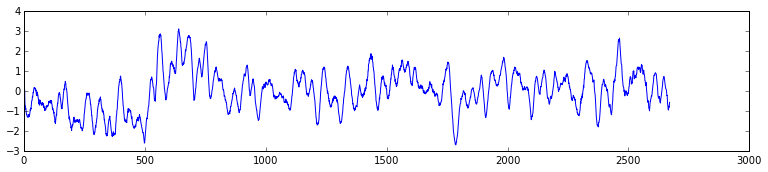


143


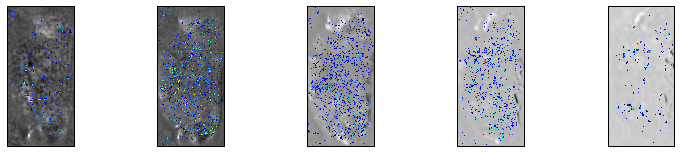

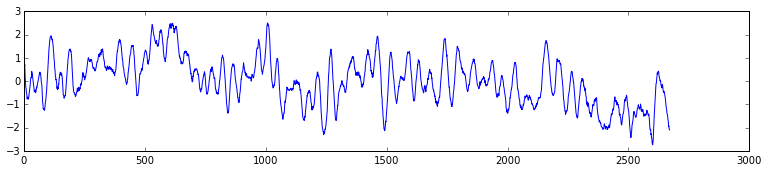


144


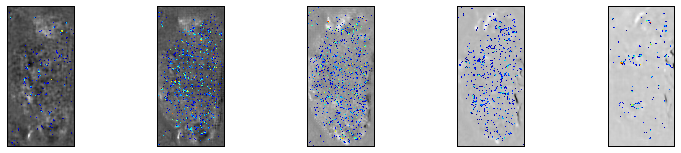

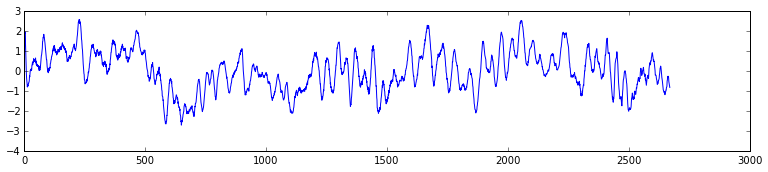


145


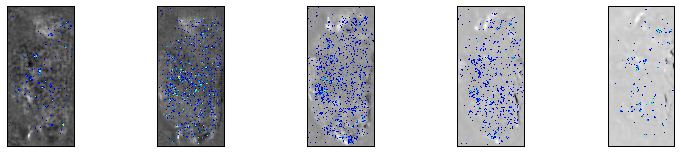

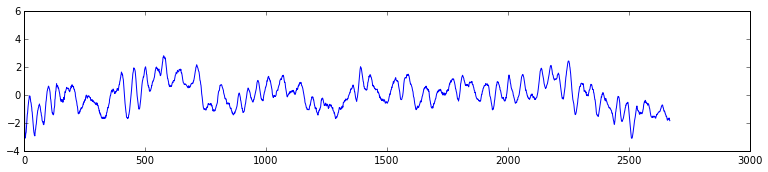


146


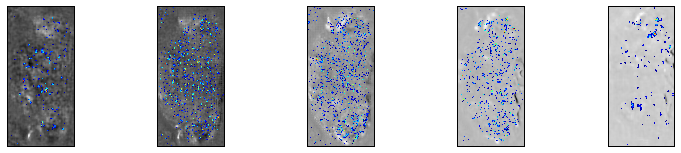

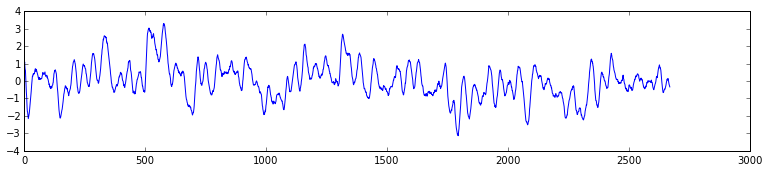


147


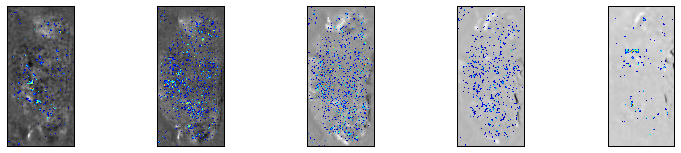

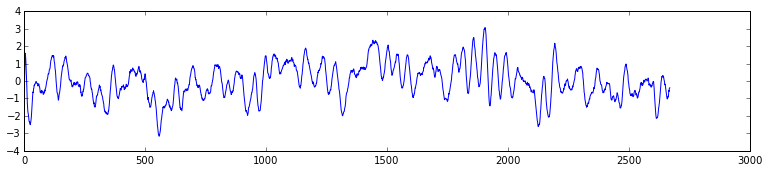


148


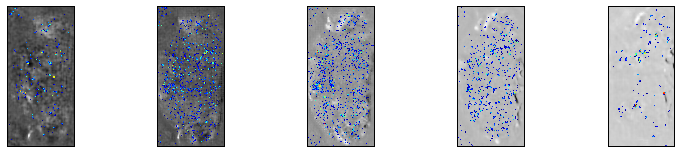

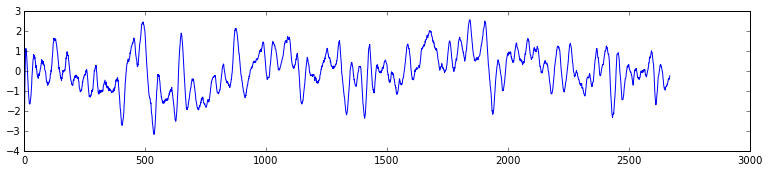


149


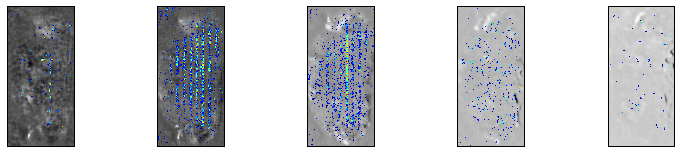

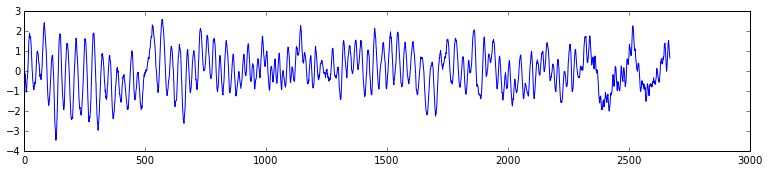

In [140]:
for j in range(S[3]):

    if S[2]>5:
        for i in range(Nstack):
            V=Dmaps[:,:,Indices[i],j]
            D1[:,:,i]=np.max(V,2)
        D2[:,:,:,j]=D1
        D1[D1==0]=np.nan
           
    else:
        for i in range(S[2]):
            V=Dmaps[:,:,i,j]
            D1[:,:,i]=V 
            

    print(j)
    for i in range(Nstack):
        plt.subplot(1,5,i+1)
        plt.imshow(Dmean[:,:,i],cmap=plt.cm.gray)
        plt.imshow(D1[:,:,i], cmap=my_cmap,interpolation='none')
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        
    plt.show()
    
   # plt.plot(TS_ROI[Order[j],:])
    plt.plot(DTvar[:,j])
    plt.show()
    
    Label_ICs.append(raw_input())
    if Label_ICs[j]=='':
        Good_ICs[j]=0
    else:
        Good_ICs[j]=1
        
        

In [141]:
D2.shape

(175, 84, 5, 150)

In [142]:
D2=Dmaps[:,:,:,:]

In [143]:
Label_ICs[57]='a'

In [144]:
set(Label_ICs)

{'', 'a'}

In [145]:
if len(Label_ICs)<S[3]:
    for j in range(S[3]-len(Label_ICs)):
      Label_ICs.append('')  

In [146]:
Dict={'a':0,'Co':1,'co':1,'CO':1,'TM':1,'Tm':1,'T':1,'Mt':2,'ME':2,'O':2,'OL':2,'o':2,'OG':3,'A':5,'G':4,'PN':5,'PI':5,'CA':5,'L':5,'LH':5,'lh':5,'l':5,'iPN':5,'KC':7,'kc':7,'M':7,'MB':8,'FB':9,'F':9,'EB':10,'eb':10,'CC':11,'C':11,'c':11,'PB':11,'pb':11,'AMMC':13,'V':12,'S':13,'s':13,'PS':13,'SOG':13,'I':12,'i':12,'D':15,'CB':15,'DCB':15,'PCB':15,'':16,'0':16}

In [147]:
Translated=[Dict[X] for X in Label_ICs]

In [148]:
G=Good_ICs.tolist();

In [149]:
len(Good_ICs)

150

In [150]:
G.count(1)

72

In [151]:
where_are_NaNs = np.isnan(D2)

D2[where_are_NaNs] = 0

In [152]:
D3=np.zeros([S[0],S[1],5,S[3]])

In [153]:
if S[2]>5:
    for i in range(5):
        D3[:,:,i,:]=np.mean(D2[:,:,Indices[i],:],2)

In [154]:
if S[2]>5:
    Final_map=np.zeros([S[0],S[1],5,3])
    Fmaps=np.zeros([S[0],S[1],5,3])
else:
    Final_map=np.zeros([S[0],S[1],3])
    Fmaps=np.zeros([S[0],S[1],3])    
C=np.zeros([S[3],3])

In [155]:
for j in range(S[3]):    
    if Good_ICs[j]:
        C[j,:]=np.squeeze(np.random.rand(3,1))
        for k in range(3):
            if S[2]>5:
                M=np.max(np.squeeze(np.reshape(D3[:,:,:,j],S[0]*S[1]*5)))
            else:
                M=np.max(np.squeeze(np.reshape(Dmaps[:,:,:,j],S[0]*S[1]*S[2])))
            Fmaps[:,:,:,k]=0.3*D3[:,:,:,j]*C[j,k]/np.max(np.squeeze(np.reshape(D3[:,:,:,j]*np.max(C[j,:]),S[0]*S[1]*5)))
        Final_map=Final_map+Fmaps

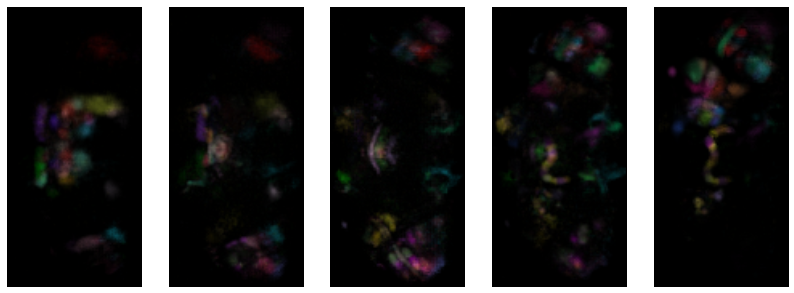

In [156]:
pylab.rcParams['figure.figsize'] = (14, 5)

if S[2]>5:
    N=Nstack
else:
    N=S[2]
for i in range(N):
        plt.subplot(1,N,i+1)
        plt.imshow(Final_map[:,:,i]) 
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

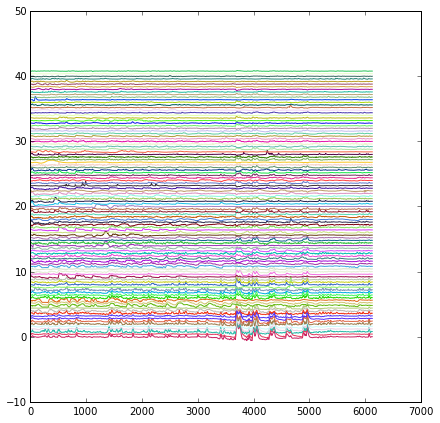

In [48]:
pylab.rcParams['figure.figsize'] = (7, 7)
h=0.4
i=0

for j in range(S[3]):
    if Good_ICs[j]:
        plt.plot((DT[:,j]+h*i),color=C[j,:])
        i=i+1

plt.show()

In [63]:
List1=[(Translated[i],i) for i in range(S[3])]

In [64]:
Newlist=sorted(List1, key=lambda List1: List1[0])

In [65]:
Neworder=[Newlist[i][1] for i in range(S[3])  if Newlist[i][0] != 16]

In [66]:
Neworder

[1,
 27,
 50,
 51,
 54,
 76,
 95,
 96,
 120,
 136,
 145,
 161,
 170,
 177,
 189,
 204,
 210,
 216,
 220,
 229,
 235,
 240,
 242,
 244,
 262,
 264,
 281,
 284,
 291,
 3,
 10,
 119,
 143,
 185,
 193,
 227,
 273,
 275,
 280,
 287,
 236,
 286,
 2,
 65,
 70,
 73,
 105,
 138,
 155,
 174,
 211,
 214,
 247,
 269,
 272,
 274,
 276,
 9,
 71,
 90,
 137,
 197,
 254,
 268,
 41,
 61,
 77,
 81,
 113,
 121,
 122,
 151,
 160,
 192,
 200,
 221,
 232,
 260,
 267,
 282,
 289,
 100,
 135,
 194,
 252,
 20,
 125,
 165,
 66,
 68,
 112,
 128,
 139,
 167,
 250,
 58,
 146,
 178,
 219,
 243,
 278,
 283,
 285,
 288,
 292,
 296,
 16,
 74]

In [67]:
Order[Neworder]

array([ 83, 105,  93, 111,  52, 118,  78,  90,  69,  99,  87, 141, 159,
        60,  43,  56, 127, 225, 136, 115, 103,  88, 137, 106,  89, 102,
        14,  25,  71,  28,  94,  61, 109, 186,  32,  91,  26,  29,  46,
        86, 192,  74,  17,  42, 112, 126, 122,  35, 257,  38,   6,   7,
        48,  27,  58,  20,  24,  39,  21,   9, 108,  10,  80,  55, 139,
       258,  30,  34, 144, 250,  13, 131,  40,  18,   2,  36,  59,   8,
        37,   0,  44,  11,  62,  16, 100, 120,  81,  70,  51,  57,  82,
       201, 134,  54,  68, 142,  77, 101,  33,  98,  23,  31, 107,  22,
        50,  15, 160, 158])

In [68]:
[Label_ICs[Neworder[i]] for i in range(len(Neworder))]  

['co',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'CO',
 'OL',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'O',
 'OG',
 'OG',
 'A',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'PN',
 'A',
 'PN',
 'PN',
 'A',
 'PN',
 'A',
 'A',
 'A',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'KC',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'MB',
 'FB',
 'FB',
 'FB',
 'FB',
 'EB',
 'EB',
 'EB',
 'PB',
 'PB',
 'PB',
 'PB',
 'CC',
 'C',
 'PB',
 'AMMC',
 'SOG',
 'AMMC',
 'SOG',
 'SOG',
 'PS',
 'SOG',
 'SOG',
 'SOG',
 'PS',
 'PS',
 'DCB',
 'PCB']

In [69]:
NewDT=DTvar[:,Order[Neworder[:]]].T

In [70]:
NewDT.shape

(108, 5466)

In [71]:
for j in range(len(Neworder)):
    A=NewDT[:,j]
    V=np.sqrt(np.var(A))
    NewDT[:,j]=A/V

In [72]:
C1=np.zeros([6,3])
C1[0][:]=(1,0,0)
C1[1][:]=(0,1,0)
C1[2][:]=(0,0,1)
C1[3][:]=(0.8,0.8,0)
C1[4][:]=(0,1,1)
C1[5][:]=(1,0,1)

In [73]:
S1=DT.shape
S1

(5466, 300)

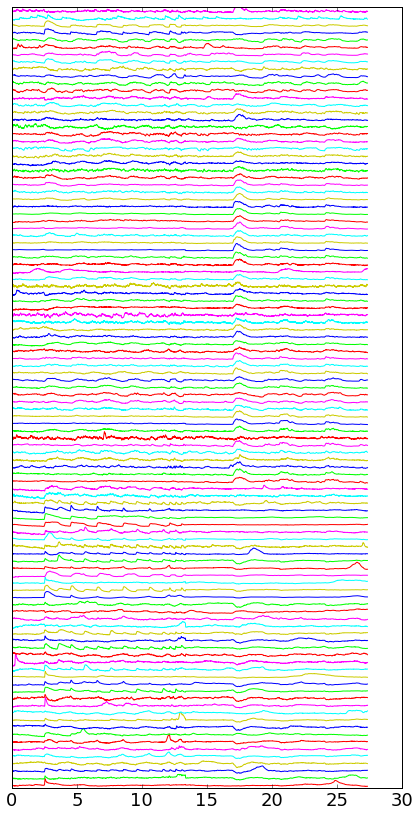

In [74]:
h=8
pylab.rcParams['figure.figsize'] = (7, 14)
i=0
t=[j*0.005 for j in range(S1[0])]

for j in range(len(Neworder)):
        plt.plot(t,NewDT[j,:]+h*j,color=C1[i%6][:])
        i=i+1
plt.ylim([-3,h*j+5])

frame1=plt.gca()
frame1.axes.get_yaxis().set_ticks([])
matplotlib.rcParams.update({'font.size': 18})
plt.show()

In [98]:
Newmaps=Dmaps[:,:,:,Neworder[:]]

In [99]:
L=len(set([Translated[Neworder[i]] for i in range(len(Neworder))]))

In [100]:
[Translated[Neworder[i]] for i in range(len(Neworder))]

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 8,
 9,
 9,
 9,
 9,
 10,
 10,
 10,
 11,
 11,
 11,
 11,
 11,
 11,
 11,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 13,
 15,
 15]

In [101]:
Regionmaps=np.zeros([S[0],S[1],L,3])
Datasort=np.zeros([S[0],S[1],S[2],L,3])

In [102]:
Regionname=[]

In [103]:
Newmaps.shape

(175, 86, 14, 108)

In [104]:
Nstack

5

In [105]:
Mapsordered=datao[:,:,:,Neworder[:]]
mapfilename=filename2+'mapsordered.nii'
Mapsordered2=np.transpose(Mapsordered,(3,2,1,0))
nimap = NiftiImage(Mapsordered2)
nimap.save(mapfilename)

ValueError: Unsupported source type. Only NumPy arrays and filename string are supported.

In [106]:
DMapsordered=Dmapso[:,:,:,Neworder[:]]
mapfilename=filename2+'zscoredmapsordered.nii'
DMapsordered2=np.transpose(DMapsordered,(3,2,1,0))
nimap = NiftiImage(DMapsordered2)
nimap.save(mapfilename)

In [107]:
j=0
i=0
k=Translated[Neworder[i]]
m=0
Regionname.append(Label_ICs[Neworder[i]])
for i in range(len(Neworder)):
    #C2=C1[i%6][:]
    for l in range(3):
        M=np.max(np.squeeze(np.reshape(Newmaps[:,:,:,i],S[0]*S[1]*S[2])))
        Regionmaps[:,:,j,l]=Regionmaps[:,:,j,l]+0.7*np.max(DMapsordered[:,:,:,i],2)*C1[i%6][l]/M
        Datasort[:,:,:,j,l]=Datasort[:,:,:,j,l]+Dmaps[:,:,:,Order[Neworder[i]]]*C1[i%6][l] 
    i=i+1
    m=m+1
    if i<len(Neworder):
        k1=Translated[Neworder[i]]
        
    if k1 != k:
        j=j+1
        k=k1
        m=0
        Regionname.append(Label_ICs[Neworder[i]])

In [108]:
Regionname

['co', 'OL', 'OG', 'A', 'KC', 'MB', 'FB', 'EB', 'PB', 'AMMC', 'DCB']

In [109]:
Datasort.shape

(175, 86, 14, 11, 3)

In [110]:
DMapscolor=np.sum(Datasort, axis=3)
DMapscolor.shape

(175, 86, 14, 3)

In [111]:
mapfilename=filename2+'zscoredmapscolor.nii'
DMapscolor2=np.transpose(DMapscolor,(3,2,1,0))

In [112]:
DMapscolor2.shape

(3, 14, 86, 175)

In [113]:
nimap = NiftiImage(DMapscolor2)
nimap.save(mapfilename)

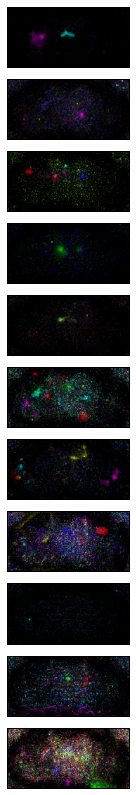

In [114]:
pylab.rcParams['figure.figsize'] = (7, 14)
import scipy
from scipy import ndimage

for i in range(L):
        plt.subplot(L,1,L-i)
        Rotated_Plot = ndimage.rotate(Regionmaps[:,:,i], -90)
        IM=plt.imshow(Rotated_Plot) 
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        

In [97]:
Sr=Regionmaps.shape
RegionmapsT=np.zeros([Sr[1],Sr[0],Sr[2],Sr[3]])
for i in range(Sr[2]):
    for j in range(Sr[3]):
        RegionmapsT[:,:,i,j]=Regionmaps[:,:,i,j].T
RegionmapsT[RegionmapsT==0]=np.nan
Dmeanproj=np.max(Dmean,2)

In [ ]:
pylab.rcParams['figure.figsize'] = (7, 14)
import scipy
from scipy import ndimage
#from skimage import color

Dmeanprojrgb=np.dstack((Dmeanproj.T,Dmeanproj.T,Dmeanproj.T))

for i in range(L):
        plt.subplot(L,1,L-i)
        #plt.imshow(0.5*Dmeanproj.T,cmap=plt.cm.gray)
        plt.imshow(0.05*Dmeanprojrgb)
        plt.imshow(np.squeeze(RegionmapsT[:,:,i]),interpolation='none')
        #Rotated_Plot = ndimage.rotate(Regionmaps[:,:,i], -90)
        #IM=plt.imshow(Rotated_Plot)
        #Rotated_Plot2= plt.imshow(mp.max(Dmean,3),cmap=plt.cm.gray)
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)

In [232]:
import scipy.io as sio
sio.savemat(foldername+'NewDT.mat',{'NewDT':NewDT})

In [233]:
names=set([Label_ICs[Neworder[i]] for i in range(len(Neworder))])  
for i in range(L):
    regionfilename=foldername+Regionname[i]+'.nii'
    D3=np.transpose(Datasort[:,:,:,i,:],(2,3,1,0))
    nim = NiftiImage(D3)
    nim.save(regionfilename)

In [234]:
%notebook -e 862_150.ipynb

In [ ]:
%store